# Installations and libraries:

In [ ]:
!pip install praat-parselmouth

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.7/10.7 MB 21.2 MB/s eta 0:00:00


In [ ]:
!pip install eyed3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 246.1/246.1 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.0/239.0 kB 9.4 MB/s eta 0:00:00


In [ ]:
!pip install pydub

In [ ]:
!pip install pyAudioAnalysis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 MB 30.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyAudioAnalysis: filename=pyAudioAnalysis-0.3.14-py3-none-any.whl size=41264373 sha256=34e0106336a139790cf076ca6fbaf1e2381e038d3f78f35aedf7f61dd9824fb8
  Stored in directory: /root/.cache/pip/wheels/a7/54/73/fa830689c2440d2c81ff175c60e374930ad1607a8881e0f43f
Successfully built pyAudioAnalysis


In [ ]:
!pip install hmmlearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.1/161.1 kB 3.2 MB/s eta 0:00:00


In [ ]:
!pip install noisereduce

In [ ]:
!pip install soundfile

In [ ]:
!pip install --upgrade tf-keras tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 32.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 54.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 50.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 44.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 26.1 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.9.0
    Uninstalling h5py-3.9.0:
      Successfully uninstalled h5py-3.9.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.15.2
    Uninstalling tensorboard-2.15.2:
      Su

In [ ]:
import os
import pandas as pd
import numpy as np
import librosa
import parselmouth

from pyAudioAnalysis import audioBasicIO, ShortTermFeatures, MidTermFeatures
from pyAudioAnalysis import audioSegmentation as aS

import noisereduce as nr
import soundfile as sf

# Segmentation:
from pydub import AudioSegment
from pydub.silence import split_on_silence

# Feature Extraction:
from parselmouth.praat import call

# Normalization:
from sklearn.preprocessing import StandardScaler

# Visualization:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import spectrogram
from sklearn.decomposition import PCA
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.metrics import confusion_matrix
import itertools

# Feature Selection:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from collections import Counter

# Modeling:
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_val_predict
from sklearn.svm import SVC
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import roc_auc_score, classification_report
from sklearn.model_selection import cross_validate

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Preprocessing:

In [ ]:
# Pre-define a function for loading the audio files

def load_audio(file_path):
    # Load an audio file. Return the signal and the sample rate
    signal, sr = librosa.load(file_path, sr=None)
    return signal, sr

Noise Reduction:

In [ ]:
## Perform noise reduction for all audio files (1st step)

def apply_spectral_subtraction(signal, sr):
    reduced_noise_signal = nr.reduce_noise(y=signal, sr=sr)
    return reduced_noise_signal

nr_input_dir = '/content/drive/My Drive/DAIC-Woz/extracted'
nr_output_dir = '/content/drive/My Drive/DAIC-Woz/step1-noise-reduced-audio'
os.makedirs(nr_output_dir, exist_ok=True)  # Create output directory if it doesn't exist

for file in os.listdir(nr_input_dir):
    if file.endswith(".wav"):
        file_path = os.path.join(nr_input_dir, file)
        audio, sample_rate = load_audio(file_path)

        processed_audio = apply_spectral_subtraction(audio, sample_rate)

        file_name = file.replace('.wav', '_NR.wav')  # modifying the name of the processed files
        output_file_path = os.path.join(nr_output_dir, file_name)

        sf.write(output_file_path, processed_audio, sample_rate)

Sampling Rate consistency:

In [ ]:
## Verifying the consistency of the sr:
'''
The default sr for the audio files is 16 kHz, which is a common and suitable sampling rate for speech audio, as it sufficiently captures the frequency range of human speech.
'''

def verify_sampling_rate(directory, target_sr):
    """
    Verify that all WAV files in the specified directory have the given sampling rate.
    """
    mismatch_info = []

    for file_name in os.listdir(directory):
        if file_name.endswith(".wav"):
            file_path = os.path.join(directory, file_name)
            y, sr = librosa.load(file_path, sr=None)  # Load the file without changing its sampling rate

            if sr != target_sr:
                mismatch_info.append((file_name, sr))

    return mismatch_info

# Define the directory and target sampling rate
directory = '/content/drive/My Drive/DAIC-Woz/extracted'
target_sampling_rate = 16000

# Run the verification
mismatches = verify_sampling_rate(directory, target_sampling_rate)

# Print the result
if not mismatches:
    print("All files have the correct sampling rate.")
else:
    print("Files with incorrect sampling rate:")
    for file_name, sr in mismatches:
        print(f"{file_name}: {sr} Hz")


All files have the correct sampling rate.


Volume-Based Segmentation with Contextual Buffering:

In [ ]:
## Perform segmentation for all audio files (2nd step)
"""
Best segmentation results observed with:
- min_silence_len = 1500
- silence_thresh = -65
- buffer = 1000
"""

def volume_based_segmentation(file_path, min_silence_len=1500, silence_thresh=-65, buffer=1000):
    """
    Segments the audio file based on volume.

    :param file_path: Path to the audio file.
    :param min_silence_len: Minimum length of silence (in ms) to be used as a segment delimiter. (Try increasing)
    :param silence_thresh: The upper bound for what is considered silence (in dB). (Try decreasing)
    :param buffer: Additional buffer (in ms) added to each segment for context. (Try increasing)
    :return: List of segmented audio chunks.
    """
    audio = AudioSegment.from_file(file_path)
    chunks = split_on_silence(
        audio,
        min_silence_len=min_silence_len,
        silence_thresh=silence_thresh,
        keep_silence=buffer
    )
    return chunks

# Directory containing the audio files
input_directory = '/content/drive/My Drive/DAIC-Woz/step1-noise-reduced-audio'
output_directory = '/content/drive/My Drive/DAIC-Woz/step2-segmentation'

# Process each audio file
for file in os.listdir(input_directory):
    if file.endswith(".wav"):
        file_path = os.path.join(input_directory, file)
        segments = volume_based_segmentation(file_path)

        # Create a subdirectory for each audio file's segments
        segment_output_dir = os.path.join(output_directory, os.path.splitext(file)[0])
        os.makedirs(segment_output_dir, exist_ok=True)

        # Save each segment to the subdirectory
        for i, segment in enumerate(segments):
            segment_file_path = os.path.join(segment_output_dir, f"segment_{i}.wav")
            segment.export(segment_file_path, format="wav")

print("Segmentation process completed.")

Segmentation process completed.


# Feature Extraction:

Feature extraction on noise-reduced / segmented audio: pitch, jitter, shimmer, mfcc, energy, hnr

In [ ]:
## Perform feature extraction for all audio files (3rd step)
# Functions that use pointprocess are inspired by "Parselmouth Praat Scripts in Python" by D. R. Feinberg
# Source: https://osf.io/6dwr3/ and https://doi.org/10.17605/OSF.IO/6DWR3

# Pitch extraction #
def extract_pitch(y, sr):
    pitches, magnitudes = librosa.core.piptrack(y=y, sr=sr)
    valid_pitches = pitches[magnitudes > np.median(magnitudes)] # select magnitudes greater than the median of all magnitudes, keep reliable pitches
    valid_pitches = valid_pitches[valid_pitches > 0]            # filter out zero pitches, keep only non-zero ones
    pitch_mean = np.mean(valid_pitches)
    pitch_median = np.median(valid_pitches)
    pitch_std = np.std(valid_pitches)
    return pitch_mean, pitch_median, pitch_std

# Jitter extraction #
def extract_jitter(file_path):
    snd = parselmouth.Sound(file_path)
    point_process = call(snd, "To PointProcess (periodic, cc)", 75, 600)
    jitter_local = call(point_process, "Get jitter (local)", 0, 0, 0.0001, 0.02, 1.3)
    jitter_ppq5 = call(point_process, "Get jitter (ppq5)", 0, 0, 0.0001, 0.02, 1.3)
    jitter_abs = call(point_process, "Get jitter (local, absolute)", 0, 0, 0.0001, 0.02, 1.3)  # Added absolute jitter
    """
    The Get jitter (local) command in Praat requires only the point process as an input. The point process represents moments of vocal fold closure and is sufficient for
    calculating jitter.
    """
    return jitter_local, jitter_ppq5, jitter_abs

# Shimmer extraction #
def extract_shimmer(file_path):
    snd = parselmouth.Sound(file_path)
    point_process = call(snd, "To PointProcess (periodic, cc)", 75, 600)
    shimmer_local = call([snd, point_process], "Get shimmer (local)", 0, 0, 0.0001, 0.02, 1.3, 1.6)
    """
    The Get shimmer (local) command requires both the original sound object (snd) and the point process. Shimmer is a measure of amplitude variation, so it requires information
    about the amplitude of the sound at the points in the point process.
    """
    shimmer_apq5 = call([snd, point_process], "Get shimmer (apq5)", 0, 0, 0.0001, 0.02, 1.3, 1.6)
    return shimmer_local, shimmer_apq5

'''
In Praat and Praat-Parselmouth, the To PointProcess (periodic, cc) function is used to convert a speech waveform into such a point process, specifically focusing on points
of vocal fold closure, which are essential for jitter and shimmer analysis.
'''

# Harmonics-to-Noise Ratio (HNR) extraction #
def extract_hnr(file_path, f0min=75):
    snd = parselmouth.Sound(file_path)
    harmonicity = call(snd, "To Harmonicity (cc)", 0.01, f0min, 0.1, 1.0)
    hnr = call(harmonicity, "Get mean", 0, 0)
    return hnr


# MFCC extraction #
def extract_mfccs(y, sr):
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)  #n_mfcc can be adjusted
    mfccs_mean = np.mean(mfccs, axis=1)
    mfccs_median = np.median(mfccs, axis=1)
    mfccs_std = np.std(mfccs, axis=1)
    #print(f"Extracted mfccs: {np.mean(mfccs, axis=1)}")
    return mfccs_mean, mfccs_median, mfccs_std

# Function to flatten the MFCC arrays -- By placing this function into comments the MFCC arrays can be extracted and used for separate visualization as well.
def flatten_mfccs(mfccs_mean, mfccs_median, mfccs_std):
    data = {}
    for i in range(13):
        data[f'MFCC_mean_{i+1}'] = mfccs_mean[i]
        data[f'MFCC_median_{i+1}'] = mfccs_median[i]
        data[f'MFCC_std_{i+1}'] = mfccs_std[i]
    return data


# Energy extraction #
def extract_energy(y):
    energy = librosa.feature.rms(y=y)
    energy_mean = np.mean(energy, axis=1)
    energy_median = np.median(energy, axis=1)
    energy_std = np.std(energy, axis=1)
    return energy_mean, energy_median, energy_std


def process_segmented_file_features(segmented_dir):
    all_segmented_features = []
    for folder in os.listdir(segmented_dir):
        folder_path = os.path.join(segmented_dir, folder)
        interview_id = folder
        if os.path.isdir(folder_path):
            for file in os.listdir(folder_path):
                if file.endswith('.wav'):
                    file_path = os.path.join(folder_path, file)
                    y, sr = librosa.load(file_path, sr=None)
                    pitch_mean, pitch_median, pitch_std = extract_pitch(y, sr)
                    jitter_local, jitter_ppq5, jitter_abs = extract_jitter(file_path)
                    shimmer_local, shimmer_apq5 = extract_shimmer(file_path)
                    hnr_value = extract_hnr(file_path)
                    mfccs_mean, mfccs_median, mfccs_std = extract_mfccs(y, sr)
                    energy_mean, energy_median, energy_std = extract_energy(y)
                    features = flatten_mfccs(mfccs_mean, mfccs_median, mfccs_std)
                    features.update({                                   # features.update() merges the dictionary returned by flatten_mfccs with the rest of the features
                        'interview_id': interview_id,
                        'filename': file,
                        'pitch_mean': pitch_mean, 'pitch_median': pitch_median, 'pitch_std': pitch_std,
                        'jitter_local': jitter_local, 'jitter_ppq5': jitter_ppq5, 'jitter_abs': jitter_abs,
                        'shimmer_local': shimmer_local, 'shimmer_apq5': shimmer_apq5,
                        'hnr' : hnr_value,
                        'energy_mean': energy_mean, 'energy_median': energy_median, 'energy_std': energy_std
                    })
                    all_segmented_features.append(features)
    return all_segmented_features

segmented_dir = '/content/drive/My Drive/DAIC-Woz/step2-segmentation'
segmented_features = process_segmented_file_features(segmented_dir)

# Convert to DataFrame
segmented_features_df = pd.DataFrame(segmented_features)

# Reorder columns to have interview_id first
cols = ['interview_id'] + ['filename'] + [col for col in segmented_features_df.columns if col != 'interview_id' and col != 'filename']
segmented_features_df = segmented_features_df[cols]

# Preview before saving
print(segmented_features_df.head())

# Save to CSV
segmented_features_df.to_csv('/content/drive/My Drive/DAIC-Woz/audio-segmented-features-1.csv', index=False)

   interview_id       filename  MFCC_mean_1  MFCC_median_1  MFCC_std_1  \
0  392_AUDIO_NR  segment_0.wav  -839.373657    -882.944397  127.808464   
1  392_AUDIO_NR  segment_1.wav  -876.093323    -908.255249  116.980209   
2  392_AUDIO_NR  segment_2.wav  -818.521240    -873.346802  139.952942   
3  392_AUDIO_NR  segment_3.wav  -820.265076    -914.532837  181.903412   
4  392_AUDIO_NR  segment_4.wav  -748.365234    -883.110474  195.812057   

   MFCC_mean_2  MFCC_median_2  MFCC_std_2  MFCC_mean_3  MFCC_median_3  ...  \
0    35.745880      34.508270   42.346085     9.782460      17.405682  ...   
1    38.231907      32.937874   47.892303     8.164501       9.032007  ...   
2    21.573553      24.742342   48.959705    14.610142      16.290401  ...   
3    44.886745      22.157631   57.759590    -6.423857      10.772861  ...   
4    43.751762      19.494816   73.174179   -10.535364       3.248508  ...   

     pitch_std  jitter_local  jitter_ppq5  jitter_abs  shimmer_local  \
0  1000.282166

Feature Extraction on noise-reduced / unsegmented audio: Formants features

In [ ]:
## Formant extraction ##
def extract_formant_features(csv_path):
    df = pd.read_csv(csv_path, header=None)
    df.columns = ['F1', 'F2', 'F3', 'F4', 'F5']
    # Calculate mean, median, and standard deviation for each formant column
    formant_means = df.mean().to_dict()
    #print("Sample means:", formant_means)
    formant_medians = df.median().to_dict()
    formant_stds = df.std().to_dict()
    # Combine the statistics in a single dictionary
    formant_features = {**{"mean_" + key: val for key, val in formant_means.items()},   # The ** operator in Python is used to unpack dictionaries
                        **{"median_" + key: val for key, val in formant_medians.items()},
                        **{"std_" + key: val for key, val in formant_stds.items()}}
    #print("Sample formant features for a file:", formant_features)  # For debugging
    return formant_features


def process_complete_files(formant_dir):
    all_complete_features = []
    for interview_id in range(301, 493):  # From 301 to 492
        formant_file_path = os.path.join(formant_dir, f"{interview_id}_FORMANT.csv")
        if os.path.exists(formant_file_path):
            formant_features = extract_formant_features(formant_file_path)    # Extract formant features
            formant_features['interview_id'] = interview_id               # Ensure interview_id is included
            #print("Appending features for interview:", interview_id)  # For debugging
            all_complete_features.append(formant_features)
    complete_features_df = pd.DataFrame(all_complete_features)
    print(complete_features_df.head())  # Inspect the first few rows
    return complete_features_df

# Specify the directory
formant_dir = '/content/drive/My Drive/DAIC-Woz/extracted'
complete_features_df = process_complete_files(formant_dir)

# Reorder columns, so that interview id appears first
columns = ['interview_id'] + [col for col in complete_features_df.columns if col != 'interview_id']
complete_features_df = complete_features_df[columns]

# Save to CSV
complete_features_df.to_csv('/content/drive/My Drive/DAIC-Woz/audio-complete-features.csv', index=False)

      mean_F1      mean_F2      mean_F3      mean_F4      mean_F5  median_F1  \
0  551.214189  1588.738396  2512.643009  3457.133230  4384.992680    520.725   
1  532.086203  1561.118949  2452.114025  3381.134701  4338.169937    468.180   
2  499.960133  1634.945265  2560.338500  3475.973444  4365.731471    460.410   
3  510.727371  1630.459987  2538.098085  3464.279341  4372.486943    474.190   
4  477.196236  1479.250671  2489.868506  3504.645700  4419.178672    445.300   

   median_F2  median_F3  median_F4  median_F5      std_F1      std_F2  \
0    1660.50    2509.50     3524.2     4448.4  251.612403  430.415679   
1    1618.85    2442.20     3420.3     4390.1  279.763415  445.955783   
2    1744.30    2559.90     3525.7     4421.9  229.548316  443.209913   
3    1754.50    2527.65     3520.7     4425.6  230.529191  467.052543   
4    1433.50    2443.70     3568.0     4489.1  164.480031  451.066875   

       std_F3      std_F4      std_F5  interview_id  
0  422.850394  452.237290 

'\nThe ** operator in Python is used for unpacking dictionaries. When used in a function call or in constructing a new dictionary, it unpacks the key-value pairs from\na dictionary into the new context. For example, **formant_features will unpack all key-value pairs from the formant_features dictionary into the new features dictionary,\neffectively merging them. This allows you to combine multiple dictionaries into one conveniently.\n\n\n-- Additional processing steps on the formant/covarep features:\n\nStatistical Analysis:\nYou could calculate other statistical measures like the standard deviation, median, or quartiles to understand the variability or distribution of the formants.\n\nTrend Analysis:\nAnalyzing how formant frequencies change over time within an audio file could reveal patterns related to speech characteristics, emotions, or health conditions.\n\nCorrelation Analysis:\nExploring correlations between different formants or between formants and other features like pitch o

Normalization:

In [ ]:
## Perform normalization for all features for all audio files (4th and final step)

# segmented_features_df and completed_features_df are the previously created dataframes for the segmented and formant features

# Select the columns to be normalized (all except 'filename' and 'interview_id', which are non-numerical)
s_feature_cols = [col for col in segmented_features_df.columns if col not in ['filename', 'interview_id']]
c_feature_cols = [col for col in complete_features_df.columns if col not in ['interview_id']]

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler to your data and transform it
segmented_features_df[s_feature_cols] = scaler.fit_transform(segmented_features_df[s_feature_cols])
complete_features_df[c_feature_cols] = scaler.fit_transform(complete_features_df[c_feature_cols])

# Save the normalized data
segmented_features_df.to_csv('/content/drive/My Drive/DAIC-Woz/audio-normalized-segmented-features-final.csv', index=False)
complete_features_df.to_csv('/content/drive/My Drive/DAIC-Woz/audio-normalized-complete-features-final.csv', index=False)

# Since StandardScaler only works with single numbers and not with arrays or other elements, MFCCs had to be flattened before normalization.

"\nNormalization cannot work with the MFCCs as they are, since StandardScaler only works with single numbers and not with arrays or other elements. So, I have to do one of the\nfollowing:\n- Flattening MFCCs: This involves converting the MFCC arrays into individual columns for each coefficient and each frame, which can significantly increase the number of features. If your analysis benefits from having detailed MFCC data at each frame, this approach is useful.\n- Excluding MFCCs: If the detailed temporal information of MFCCs is not crucial for your analysis, or if the dimensionality increase is a concern, you might choose to exclude MFCCs from normalization. You could summarize MFCCs (e.g., mean or median across frames) before normalization.\n\n\nResults of the normalization:\nIt appears that a form of Z-score normalization (standardization) has been applied, where the mean of each feature is adjusted to be around 0, and the features are scaled\naccording to their standard deviation. T

Visualizations:

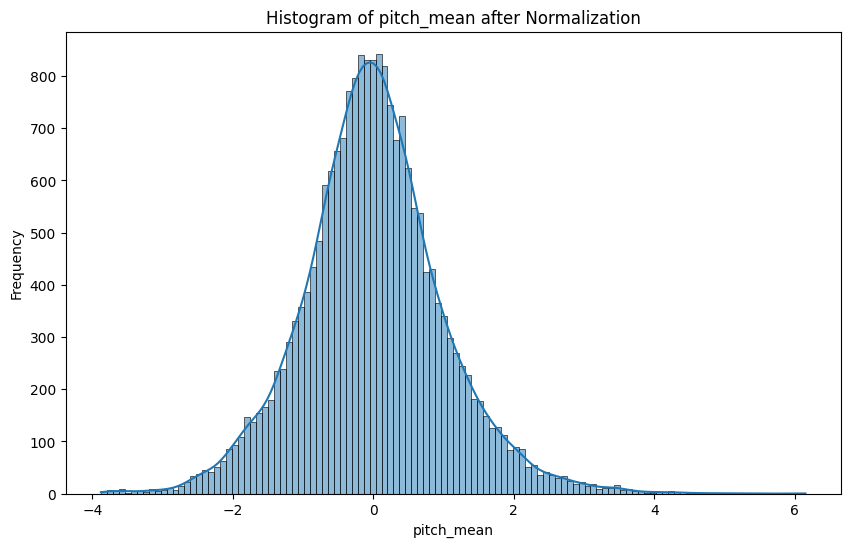

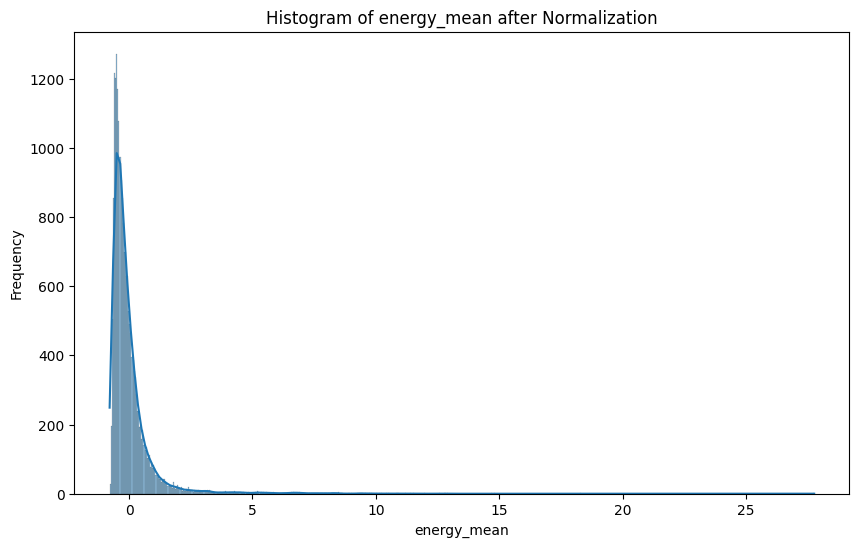

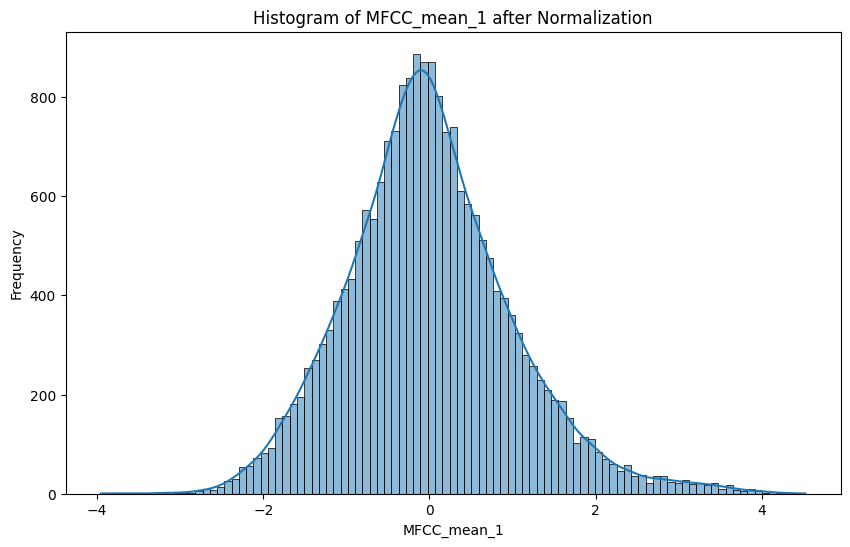

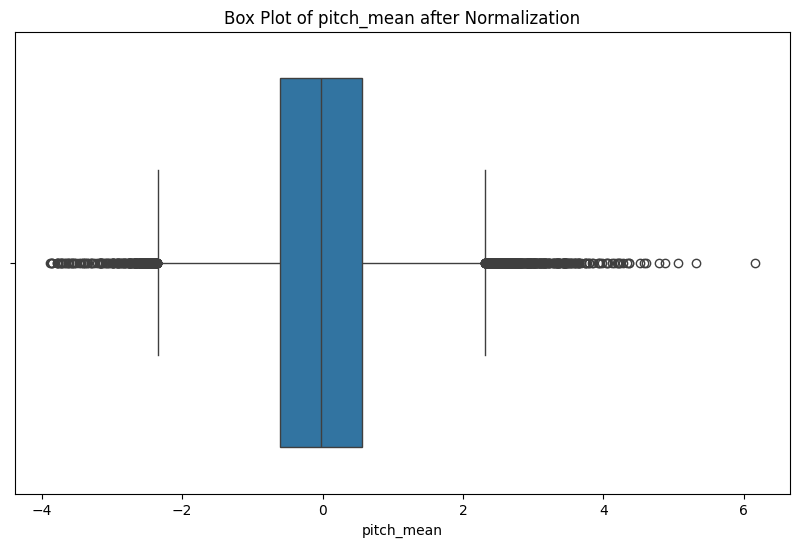

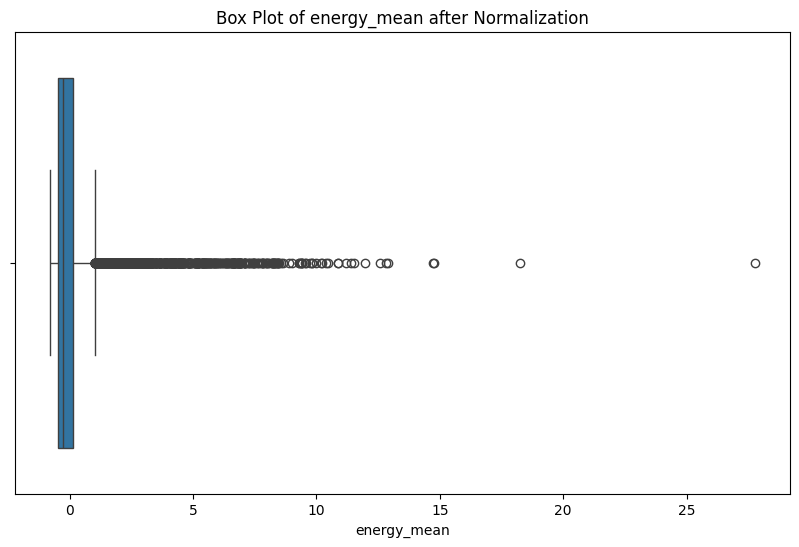

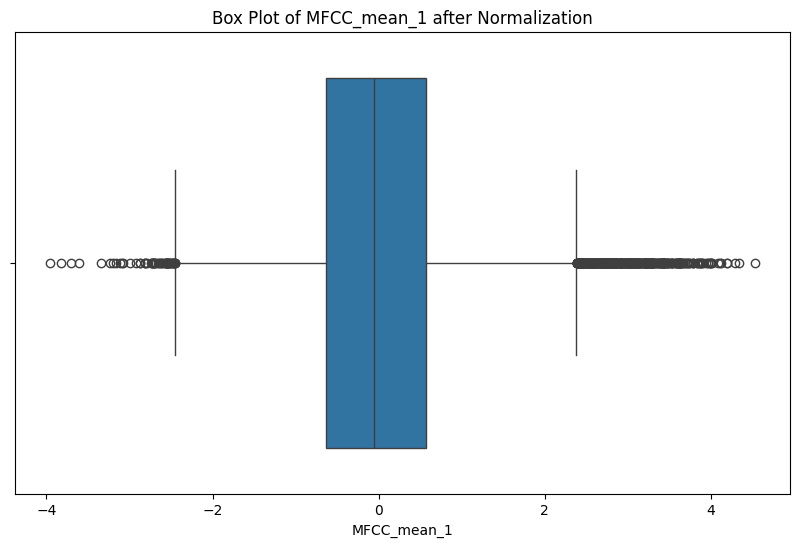

In [ ]:
## Visualization to assess the distribution of the features after normalization, to check for the effectiveness of the normalization and the presence of any bias or skewness.
# This is across all the segments of all the interviews

# Example features
features_to_plot = ['pitch_mean', 'energy_mean', 'MFCC_mean_1']

# Histograms are useful for visualizing the distribution of the data. They can prove whether the data is approximately normally distributed after normalization.
# Plot histograms for a selection of features
for feature in features_to_plot:
    plt.figure(figsize=(10, 6))
    sns.histplot(segmented_features_df[feature], kde=True)  # Insert 'completed_features_df' to visualize the formant features accordingly
    plt.title(f'Histogram of {feature} after Normalization')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

# Box plots are excellent for visualizing the central tendency, dispersion, and outliers within the data.
# Plot box plots for the same selection of features
for feature in features_to_plot:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=segmented_features_df[feature])
    plt.title(f'Box Plot of {feature} after Normalization')
    plt.xlabel(feature)
    plt.show()

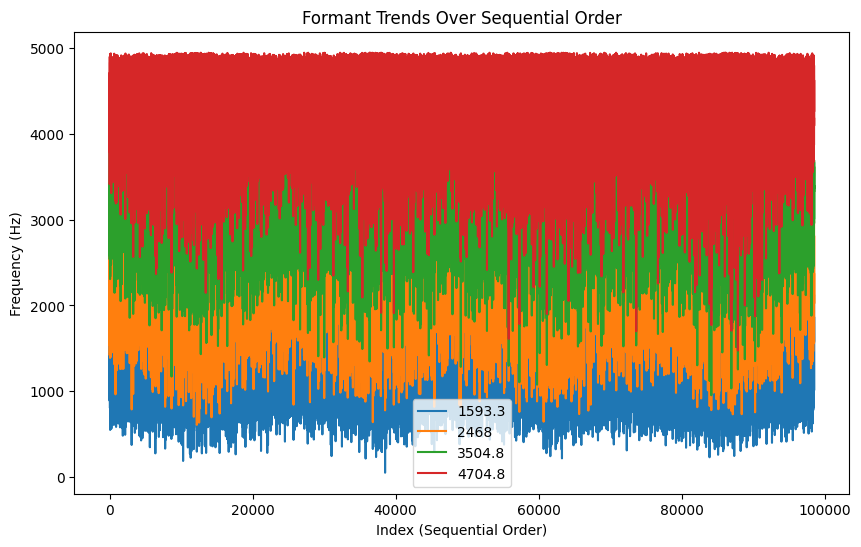

In [ ]:
## Instead of plotting the data against time, plot the formant frequencies against their index in the dataset. This approach assumes that each point follows
# sequentially but does not specify the exact time interval between them. It can still provide insights into how formant frequencies change throughout the recording.

def plot_formant_trends_without_time(csv_path):
    df = pd.read_csv(csv_path)
    plt.figure(figsize=(10, 6))

    # Use the DataFrame index as a proxy for time
    for col in df.columns[1:]:  # Excluding filename from the plot
        plt.plot(df.index, df[col], label=col)

    plt.xlabel('Index (Sequential Order)')
    plt.ylabel('Frequency (Hz)')
    plt.title('Formant Trends Over Sequential Order')
    plt.legend()
    plt.show()

plot_formant_trends_without_time('/content/drive/My Drive/DAIC-Woz/extracted/303_FORMANT.csv')

<ipython-input-13-0443c82ef4f7>:20: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(t, f, 10 * np.log10(Sxx))


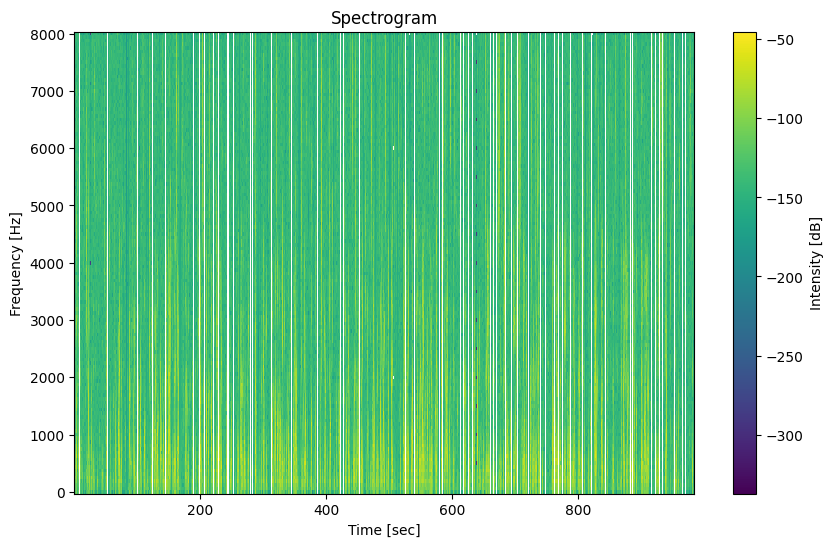

In [ ]:
# For trend analysis and spectrogram visualization, the noise-reduced audio is generally the best choice.

def plot_spectrogram(audio_path):
    # Load the audio file
    sr = 16000  # Sample rate
    y, sr = librosa.load(audio_path, sr=sr)

    # Compute the spectrogram
    f, t, Sxx = spectrogram(y, sr)

    plt.figure(figsize=(10, 6))
    plt.pcolormesh(t, f, 10 * np.log10(Sxx))
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.title('Spectrogram')
    plt.colorbar(label='Intensity [dB]')
    plt.show()

# Usage
plot_spectrogram('/content/drive/My Drive/DAIC-Woz/step1-noise-reduced-audio/303_AUDIO_NR.wav')

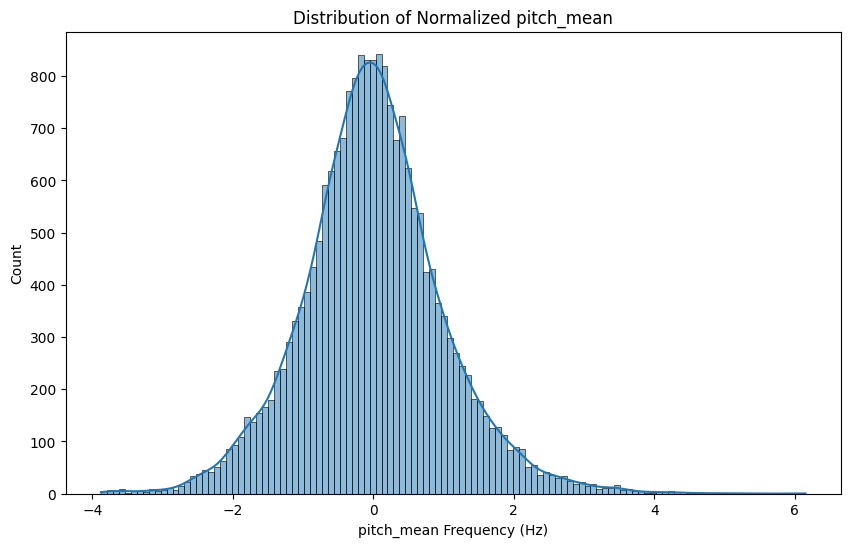

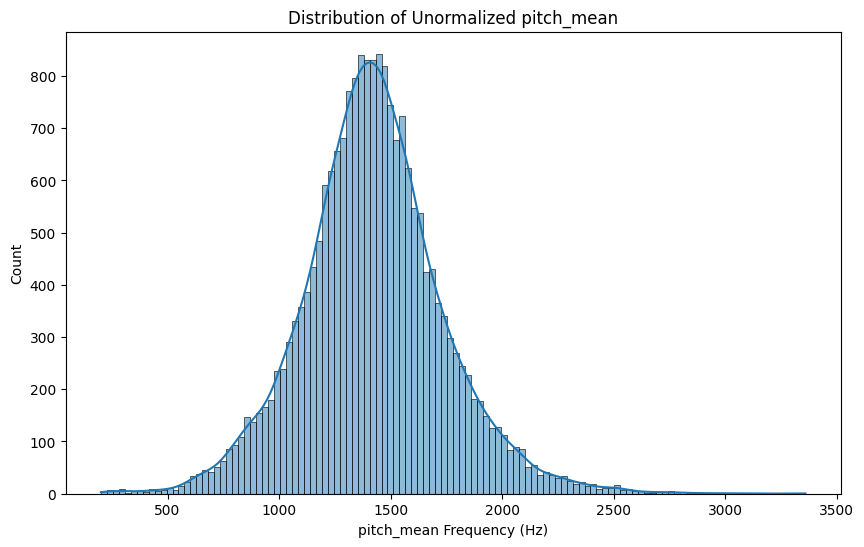

In [ ]:
# Visualize statistical distributions - creating plots for a single feature, for the combined dataset of features and their statistics:

"""
What can the distributions of the various features indicate:

Formants: distribution plot can help identify common patterns or variations in speech
Pitch: inspect for common pitch levels or variations within or across participants
Energy: distribution of energy levels, which indicate loudness and intensity
Jitter and Shimmer: distribution plot may highlight common levels or outliers in frequency/amplitute variations.
Harmonic-to-Noise Ratio (HNR): distribution can help identify patterns of clear vs noisy speech
MFCCs: visualizing the distribution of MFCCs can help understand the common textures and qualities of speech across the dataset
"""

# Example using seaborn for a histogram -- Comparing normalized with un-normalized distribution plots of a given feature
def plot_norm_feature_distribution(csv_path, feature):
    df = pd.read_csv(csv_path)
    plt.figure(figsize=(10, 6))
    sns.histplot(df[feature], kde=True)
    plt.title(f'Distribution of Normalized {feature}')
    plt.xlabel(f'{feature} Frequency (Hz)')
    plt.ylabel('Count')
    plt.show()

def plot_feature_distribution(csv_path, feature):
    df = pd.read_csv(csv_path)
    plt.figure(figsize=(10, 6))
    sns.histplot(df[feature], kde=True)
    plt.title(f'Distribution of Unormalized {feature}')
    plt.xlabel(f'{feature} Frequency (Hz)')
    plt.ylabel('Count')
    plt.show()

# Usage
plot_norm_feature_distribution('/content/drive/My Drive/DAIC-Woz/audio-normalized-segmented-features-final.csv', 'pitch_mean')
plot_feature_distribution('/content/drive/My Drive/DAIC-Woz/audio-segmented-features-final.csv', 'pitch_mean')

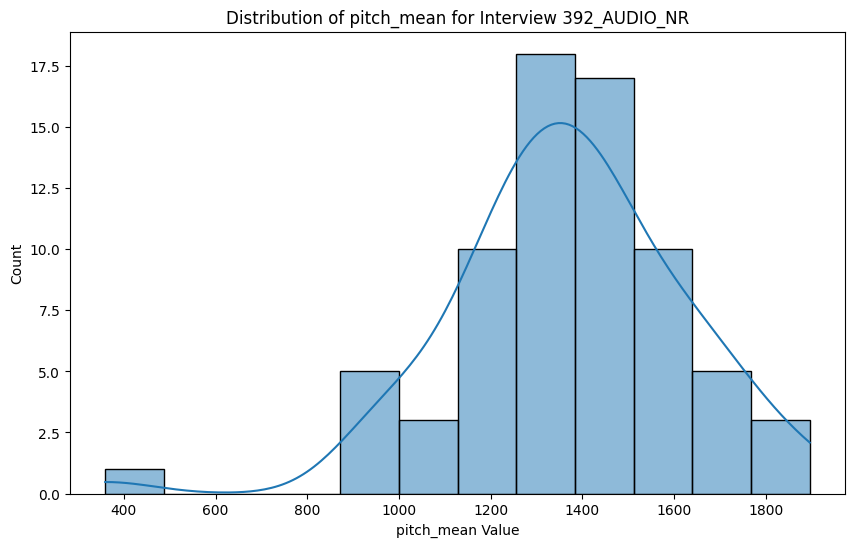

'\nFor each interview, this function will visualize how the specified feature (pitch_mean in this example) is distributed across different segments.\nThis distribution can provide insights into the variability of pitch within the interview, which may be relevant for understanding speech patterns related to mental\nhealth conditions.\n\nUseful Insights: For instance, a highly varied pitch distribution might suggest emotional variability during the interview, while a narrow distribution could indicate\nmore consistent emotional or mental states.\n'

In [ ]:
## Visualize statistical distributions - creating plots for a single feature, for a single interview:

def plot_feature_distribution_for_interview(csv_path, interview_id, feature):
    # Load the dataset
    df = pd.read_csv(csv_path)

    # Filter the DataFrame for the specific interview
    interview_df = df[df['interview_id'] == interview_id]

    # Plot the histogram for the filtered DataFrame
    plt.figure(figsize=(10, 6))
    sns.histplot(interview_df[feature], kde=True)
    plt.title(f'Distribution of {feature} for Interview {interview_id}')
    plt.xlabel(f'{feature} Value')
    plt.ylabel('Count')
    plt.show()

# Usage
plot_feature_distribution_for_interview('/content/drive/My Drive/DAIC-Woz/audio-segmented-features-final.csv', '392_AUDIO_NR', 'pitch_mean')

<ipython-input-20-031fb2090b4b>:36: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


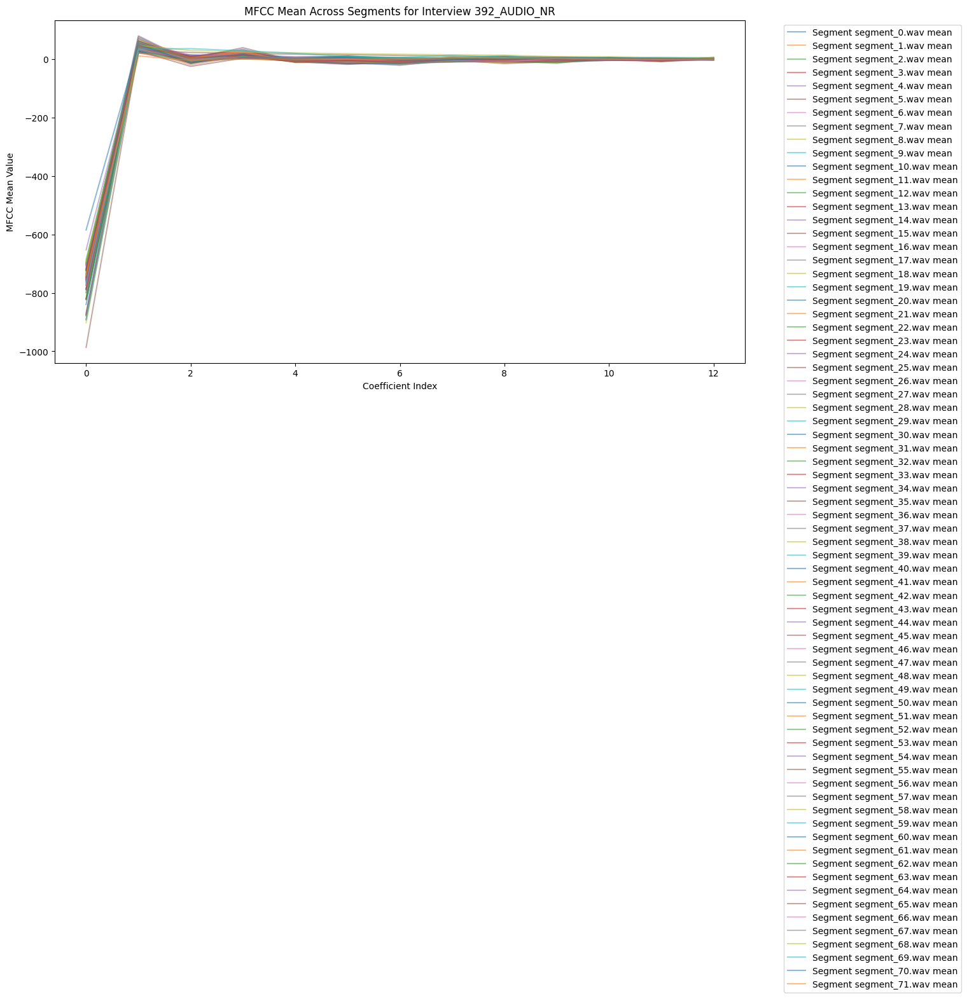

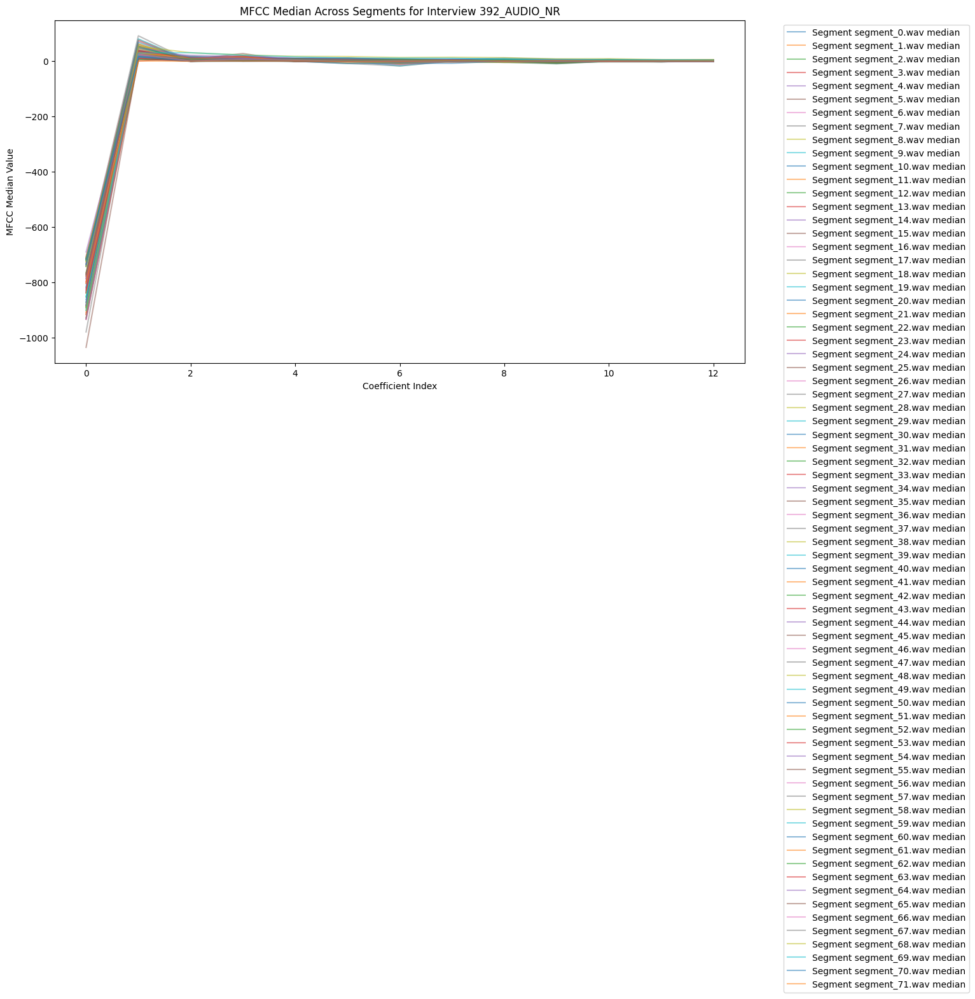

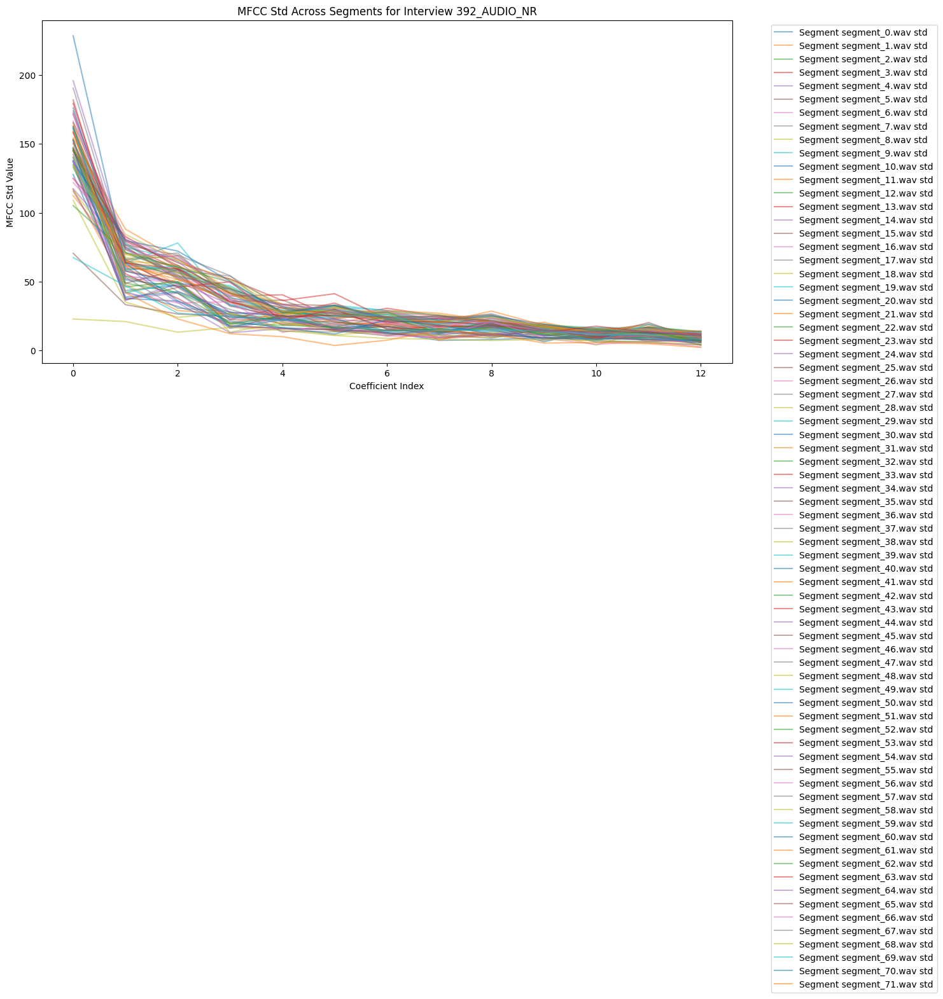

In [ ]:
## MFCCs plots

# Use the un-flattened MFCCs from each segment, which preserve the temporal structure of the MFCCs across frames.
# This allows for visualizing how MFCCs vary over time within a segment or illustrate the average MFCC profile across segments.

def plot_mfcc_stats_for_interview(csv_path, interview_id):
    # Load the dataset from the CSV file
    df = pd.read_csv(csv_path)

    # Filter the DataFrame for the specified interview
    interview_df = df[df['interview_id'] == interview_id]

    stats = ['mean', 'median', 'std']

    for stat in stats:
        plt.figure(figsize=(14, 7))

        # Iterate through each row and plot the MFCCs for the current stat
        for _, row in interview_df.iterrows():
            # Convert the string representation of the MFCCs into a numpy array
            # Preprocess the string to replace spaces with commas for a valid array format
            mfcc_str = row[f'mfcc_{stat}'].replace('[', '').replace(']', '')
            mfcc_array = np.fromstring(mfcc_str, sep=' ')

            if mfcc_array.size > 0:
                plt.plot(mfcc_array, label=f'Segment {row["filename"]} {stat}', alpha=0.5)

        plt.title(f'MFCC {stat.capitalize()} Across Segments for Interview {interview_id}')
        plt.xlabel('Coefficient Index')
        plt.ylabel(f'MFCC {stat.capitalize()} Value')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

# Usage:
plot_mfcc_stats_for_interview('/content/drive/My Drive/DAIC-Woz/audio-mfcc-arrays.csv', '392_AUDIO_NR')

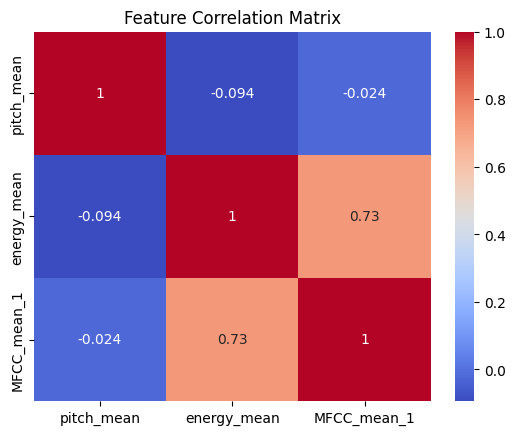

In [ ]:
# correlation matrix or heatmap to identify potential correlations or independence between features.

correlation_matrix = segmented_features_df[features_to_plot].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Feature Correlation Matrix')
plt.show()

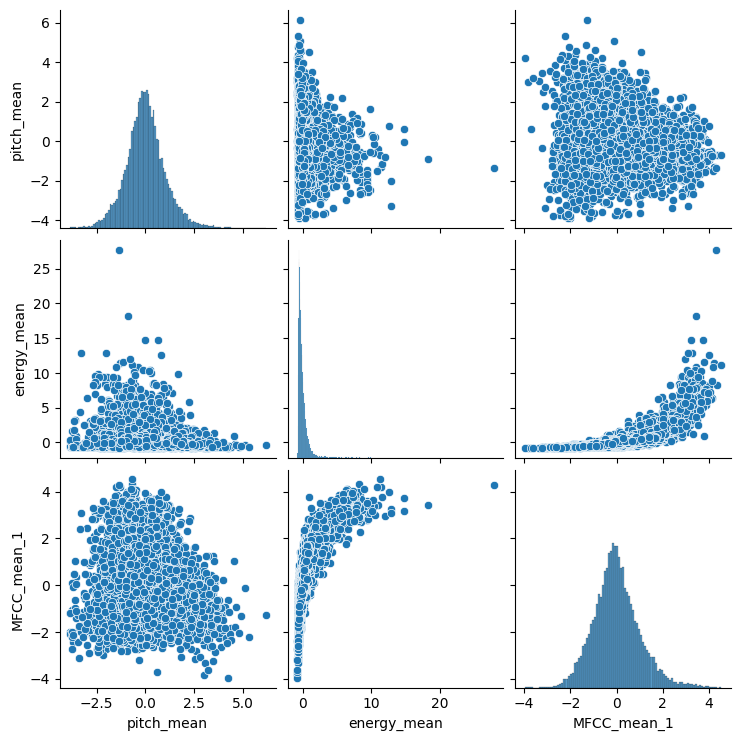

In [ ]:
# pairplots can help visualize the relationship between pairs of features

sns.pairplot(segmented_features_df[features_to_plot]) # features_to_plot can be adjusted in an earlier script
plt.show()

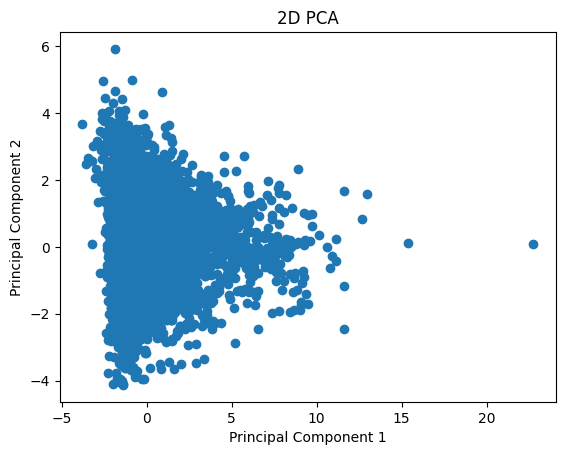

In [ ]:
# PCA can be applied to reduce dimensionality and visualize the data in two or three dimensions.
# This can help identify clusters or groupings in the data.

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(segmented_features_df[features_to_plot])
principalDf = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2'])
plt.figure()
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA')
plt.scatter(principalDf['PC1'], principalDf['PC2'])
plt.show()

# Post-Processing on complete feature set:

Creating a numerical_id column in my segmented feature set to align the labels from the text model

In [ ]:
audio_features = pd.read_csv('/content/drive/My Drive/DAIC-Woz/audio-normalized-segmented-features-final.csv')

audio_features['numerical_id'] = audio_features['interview_id'].apply(lambda x: x.split('_')[0])

#print(audio_features.head())

# Convert 'numerical_id' values to integers
audio_features['numerical_id'] = audio_features['numerical_id'].astype(int)

# Save to a new file
audio_features.to_csv('/content/drive/My Drive/DAIC-Woz/audio-normalized-segmented-features-final_with_id.csv', index=False)

In [ ]:
# Merging the segmented features with the text feature set's Marker column (which contains the binary labels)

# Load text features df:
text_features = pd.read_csv('/content/drive/My Drive/DAIC-Woz/COMPLETE_text_feature_set_labeled_with_id.csv')

merged_df = audio_features.merge(text_features[['numerical_id', 'Marker']], on='numerical_id', how='left')

# Save to a new file
merged_df.to_csv('/content/drive/My Drive/DAIC-Woz/Audio-normalized-segmented-labeled-features-FINAL.csv', index=False)

Align the binary labels with the formant features as well:

In [ ]:
formant_features = pd.read_csv('/content/drive/My Drive/DAIC-Woz/audio-normalized-complete-features-final.csv')

# Merging the formant features with the text feature set's Marker column
merged_formant_df = formant_features.merge(text_features[['numerical_id', 'Marker']], left_on='interview_id', right_on='numerical_id', how='left')

# Drop extra column
merged_formant_df = merged_formant_df.drop('numerical_id', axis=1)

# Save to a new file
merged_formant_df.to_csv('/content/drive/My Drive/DAIC-Woz/Audio-normalized-labeled-formant-features-FINAL.csv', index=False)

Exploratory Data Analysis (EDA):

In [ ]:
# Load the data
segmented_features_df = pd.read_csv('/content/drive/My Drive/DAIC-Woz/Audio-normalized-segmented-labeled-features-FINAL.csv')
formant_features_df = pd.read_csv('/content/drive/My Drive/DAIC-Woz/Audio-normalized-labeled-formant-features-FINAL.csv')

# Print basic descriptive statistics
print(segmented_features_df.describe())
print(formant_features_df.describe())

        MFCC_mean_1  MFCC_median_1    MFCC_std_1   MFCC_mean_2  MFCC_median_2  \
count  2.055900e+04   2.055900e+04  2.055900e+04  2.055900e+04   2.055900e+04   
mean  -1.935425e-16   4.727966e-16 -2.668121e-16 -7.879943e-17   4.976806e-17   
std    1.000024e+00   1.000024e+00  1.000024e+00  1.000024e+00   1.000024e+00   
min   -3.955379e+00  -3.701816e+00 -4.852073e+00 -5.994668e+00  -2.907846e+00   
25%   -6.374983e-01  -8.020968e-01 -5.921970e-01 -6.553507e-01  -9.026476e-01   
50%   -5.879029e-02   1.023269e-01  1.775643e-02  8.877144e-02  -1.522749e-02   
75%    5.703001e-01   6.733981e-01  6.441627e-01  6.942256e-01   8.071675e-01   
max    4.525475e+00   3.959063e+00  5.411305e+00  5.257604e+00   4.348539e+00   

         MFCC_std_2   MFCC_mean_3  MFCC_median_3    MFCC_std_3   MFCC_mean_4  \
count  2.055900e+04  2.055900e+04   2.055900e+04  2.055900e+04  2.055900e+04   
mean  -9.400634e-17  4.976806e-17  -2.211914e-17 -1.437744e-16 -9.953612e-17   
std    1.000024e+00  1.000024e

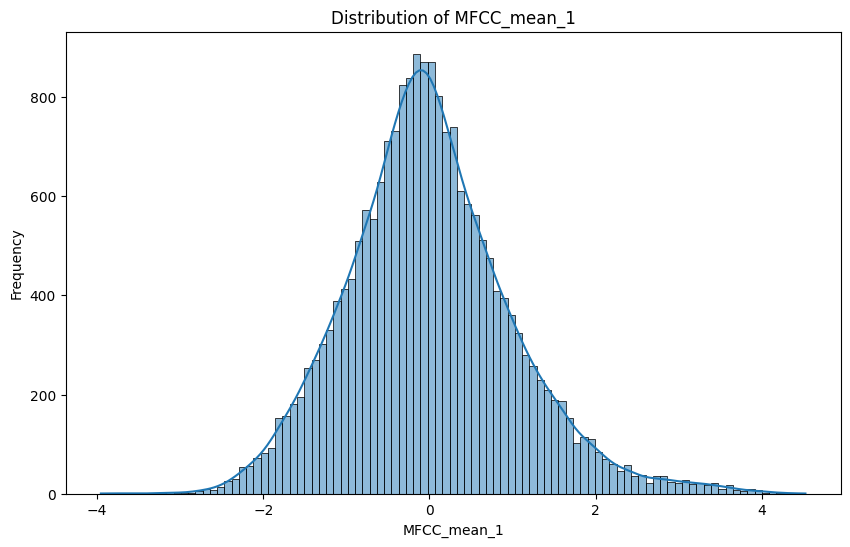

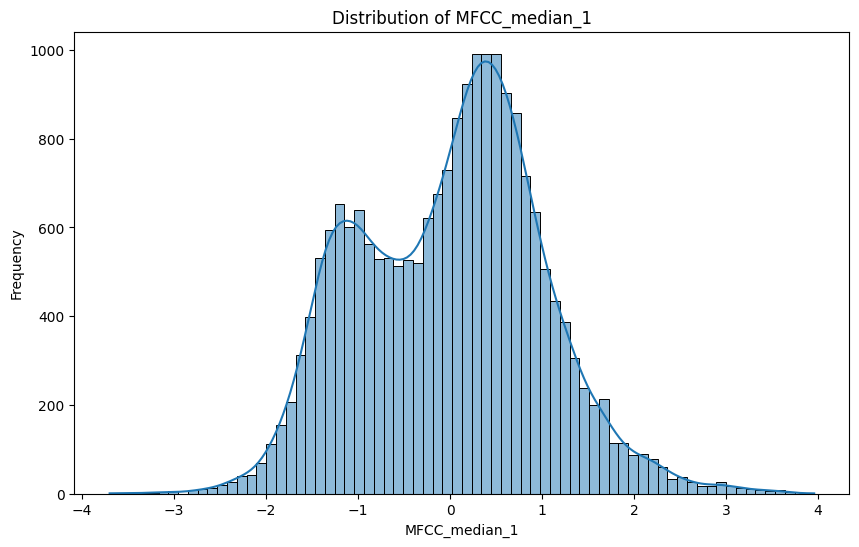

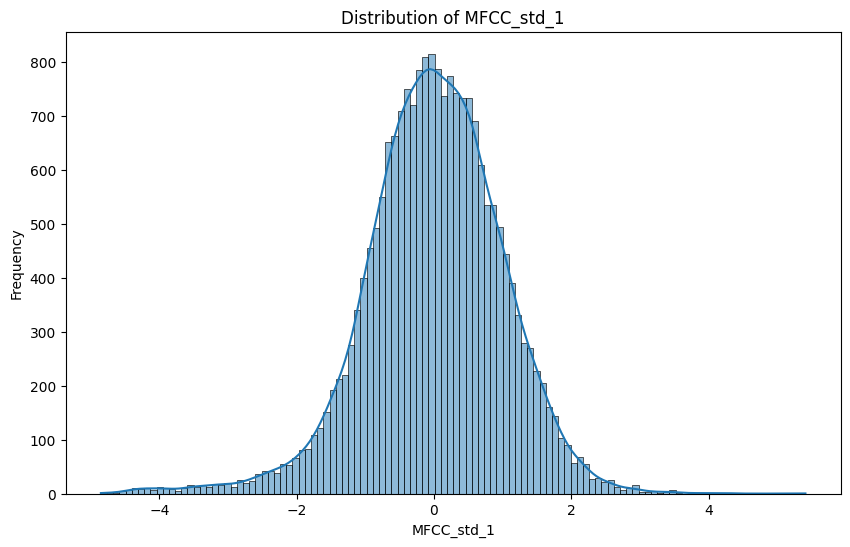

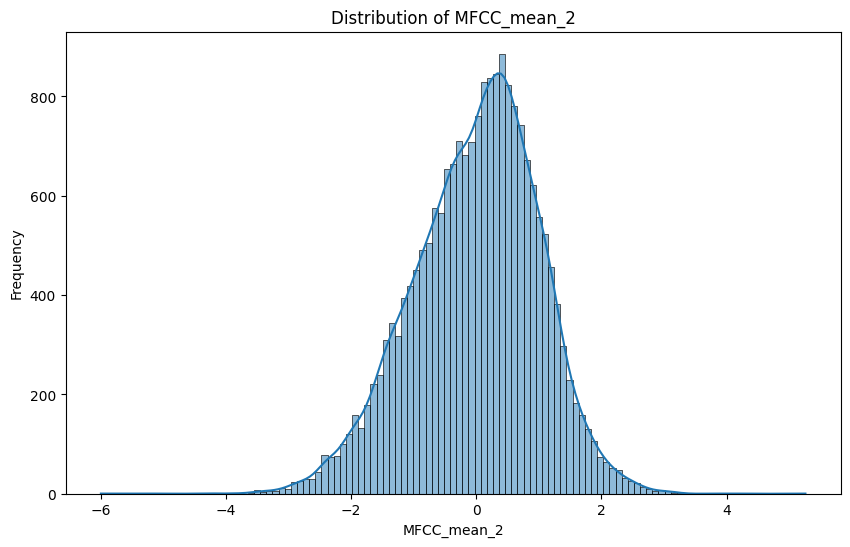

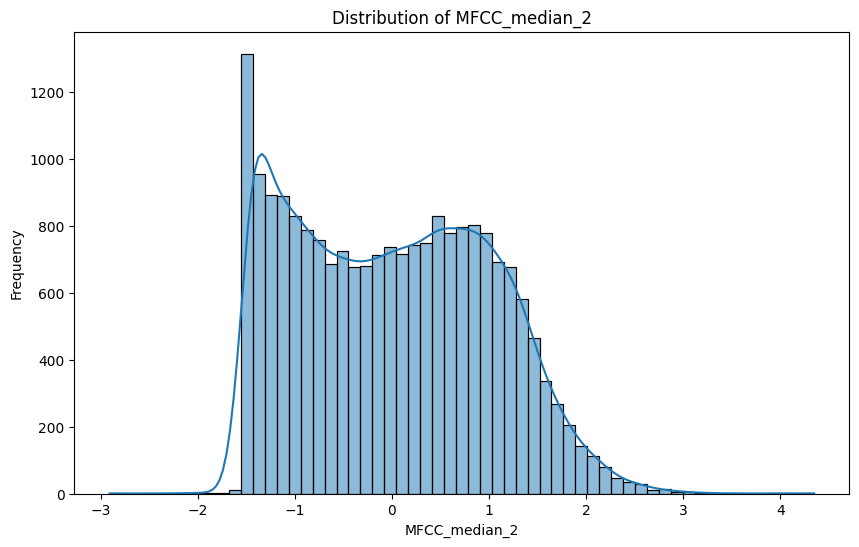

...

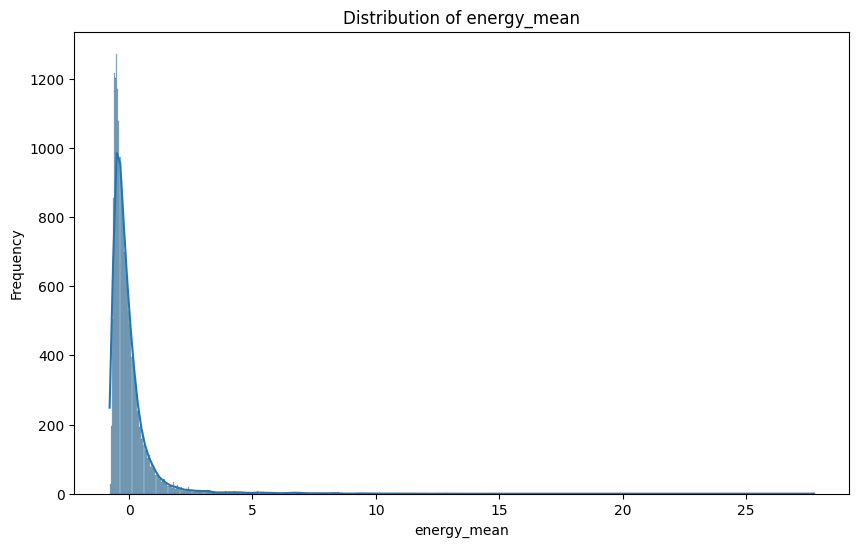

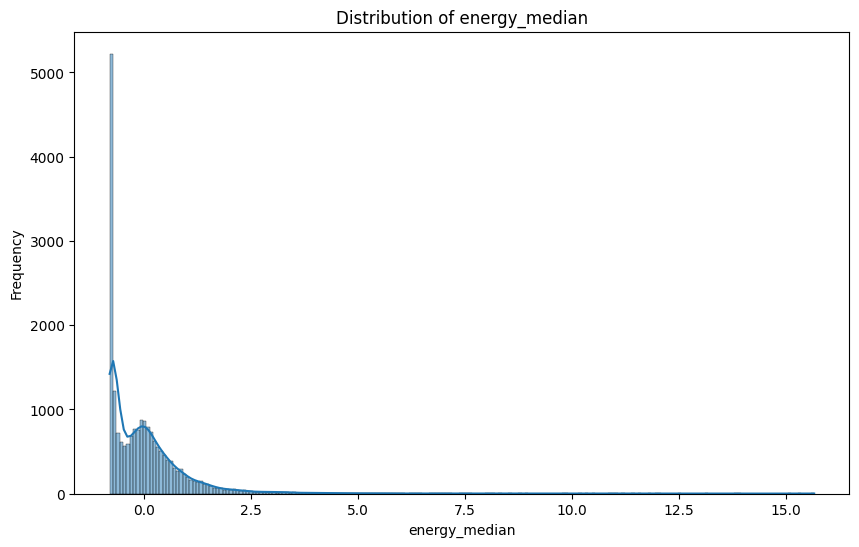

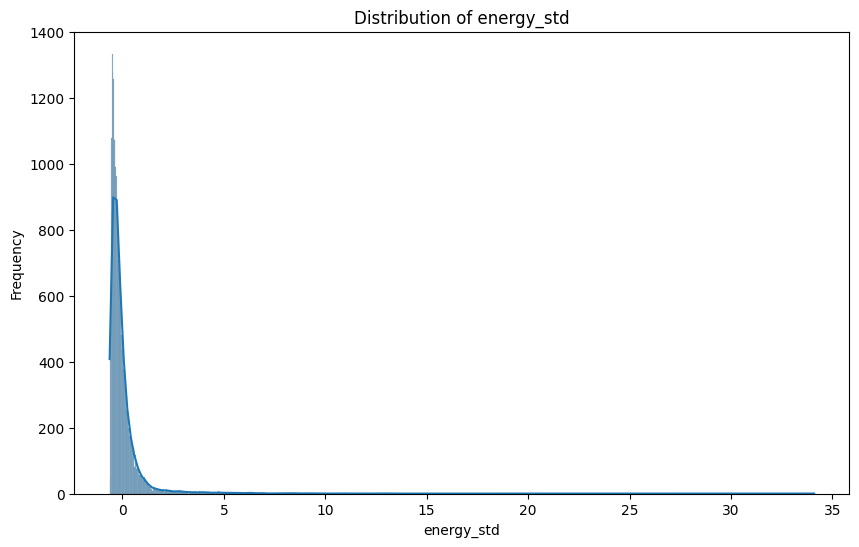

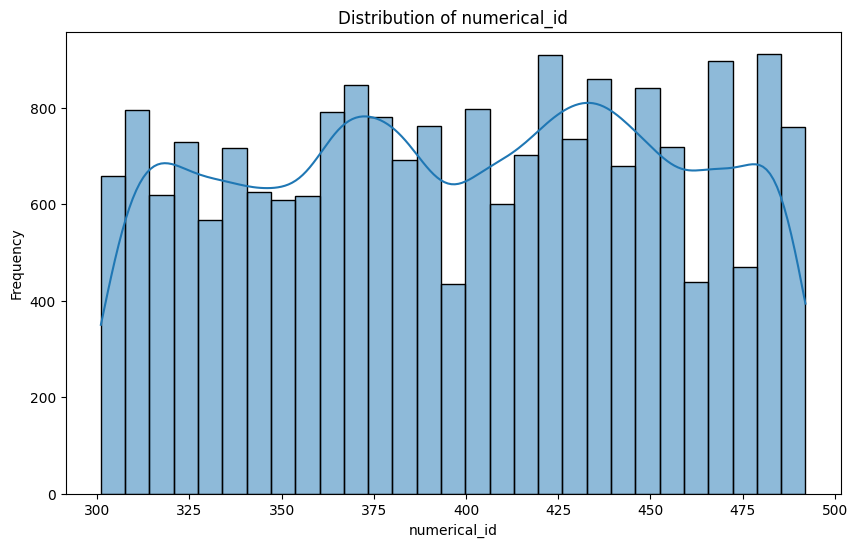

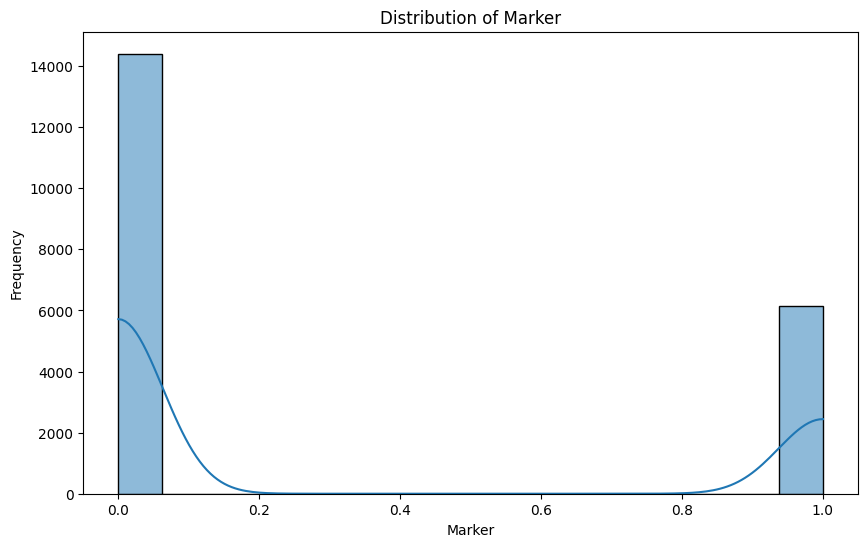

In [ ]:
## Feature Distributions for segmented features:

# Exclude non-numerical columns
numerical_features = segmented_features_df.select_dtypes(include=['number']).columns

# Plotting histograms for numerical features
for column in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.histplot(segmented_features_df[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

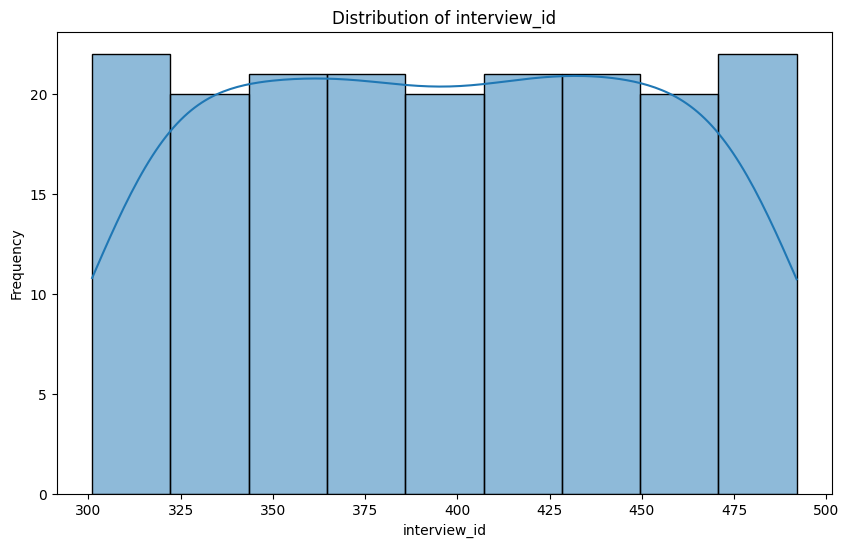

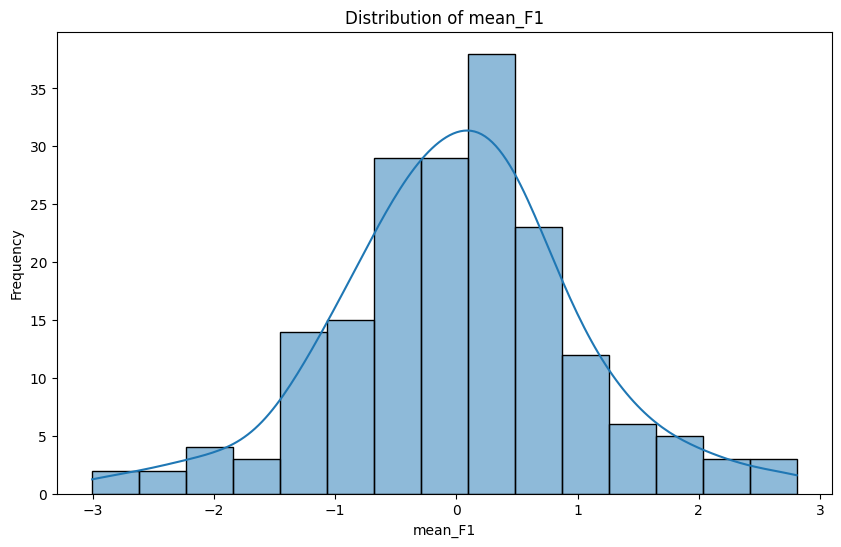

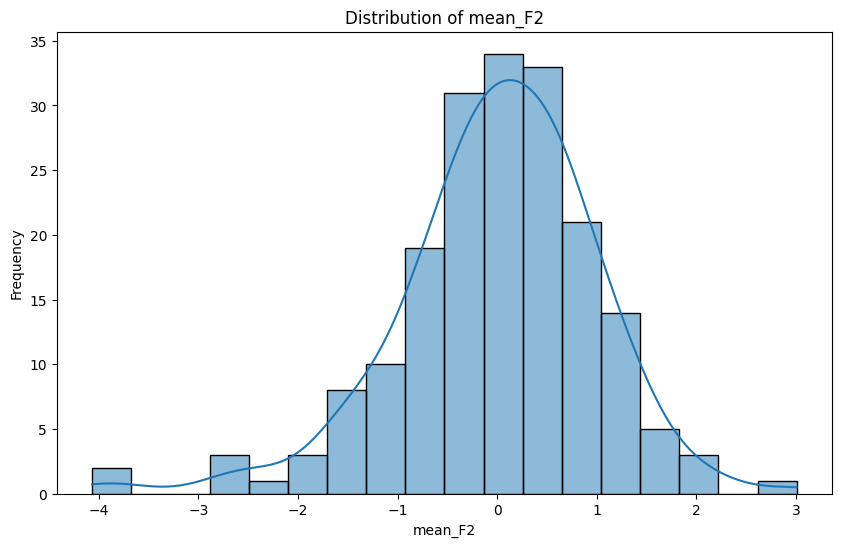

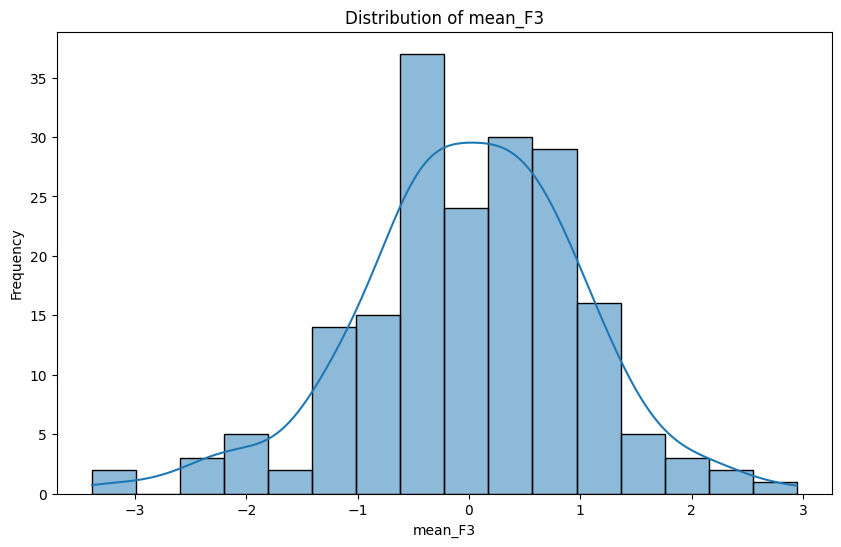

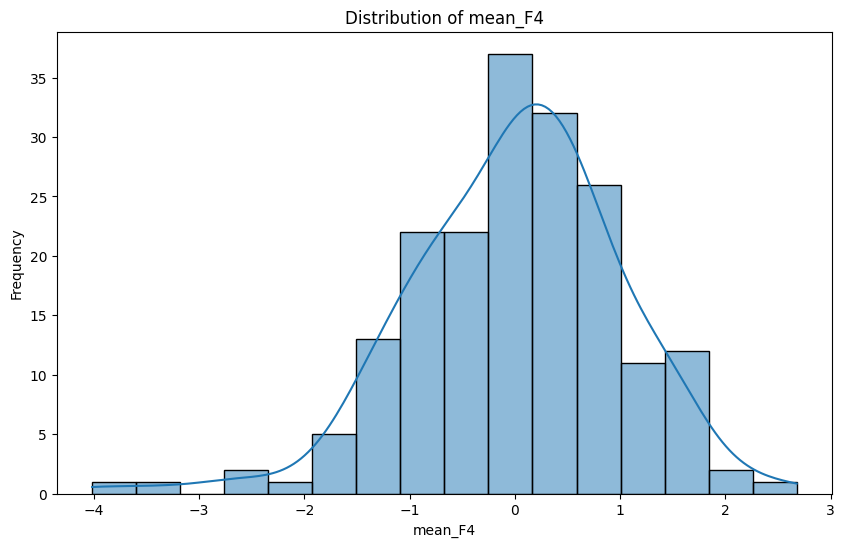

...

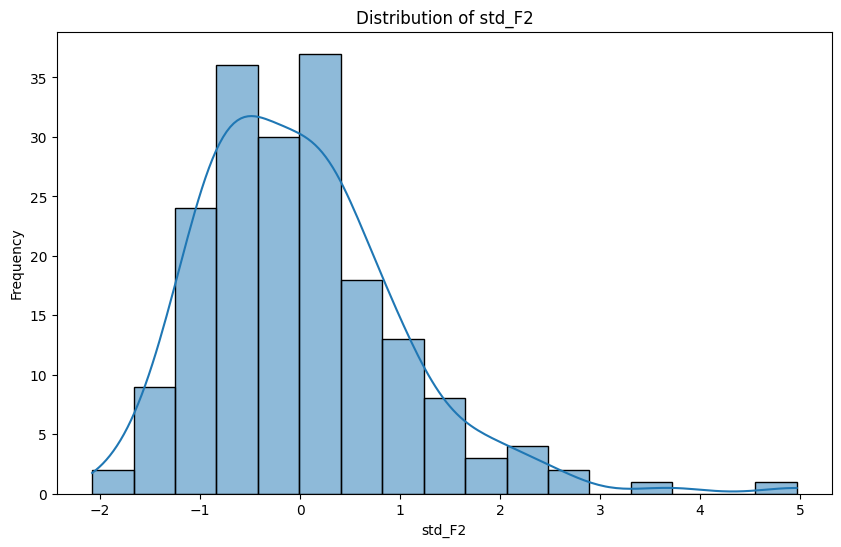

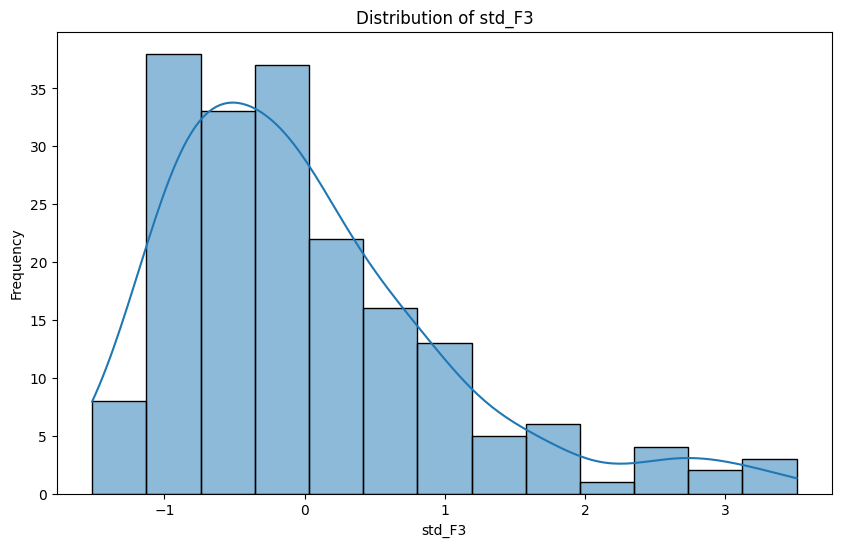

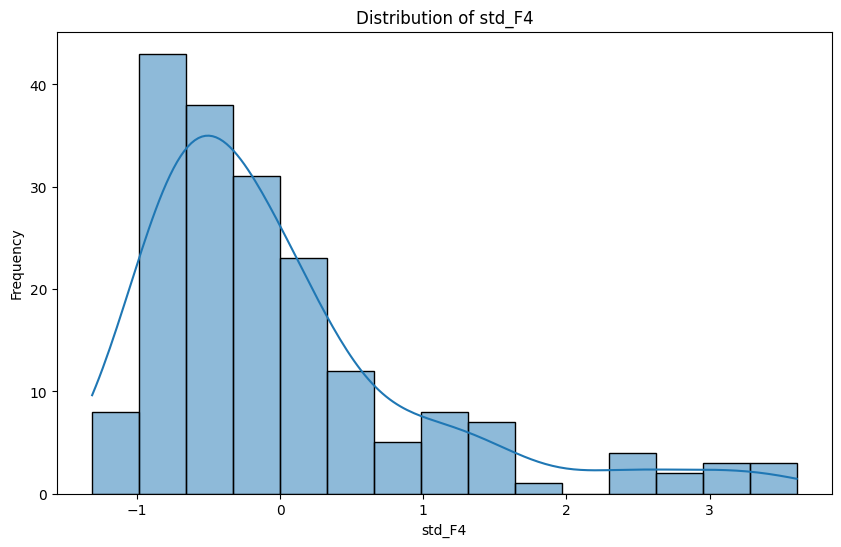

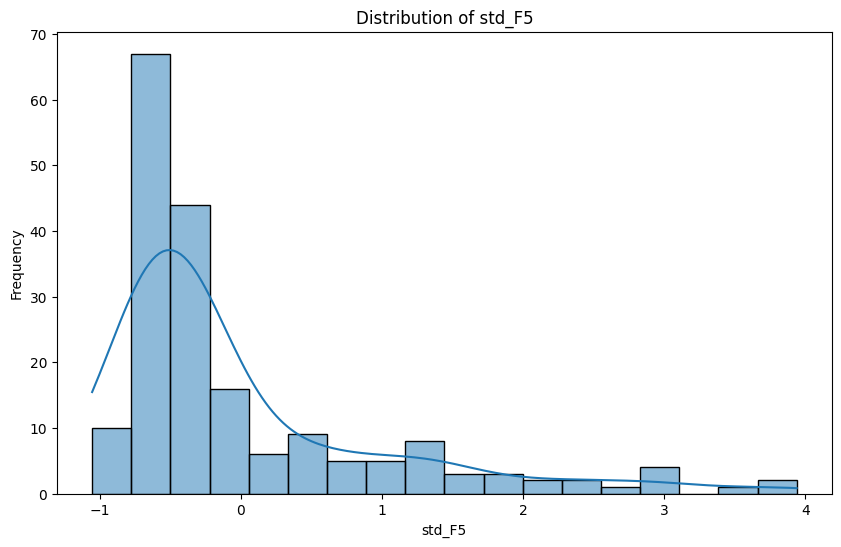

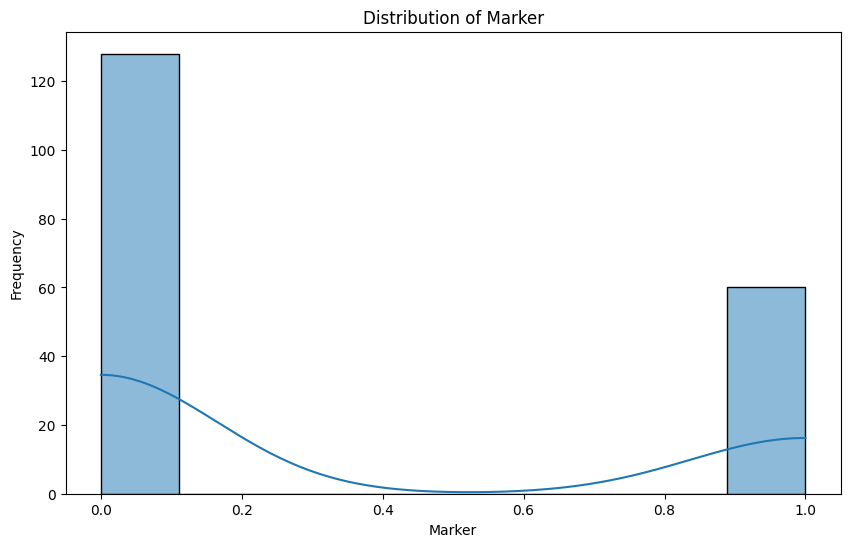

In [ ]:
## Feature Distributions for formant features:

# Exclude non-numerical columns
f_numerical_features = formant_features_df.select_dtypes(include=['number']).columns

# Plotting histograms for numerical features
for column in f_numerical_features:
    plt.figure(figsize=(10, 6))
    sns.histplot(formant_features_df[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

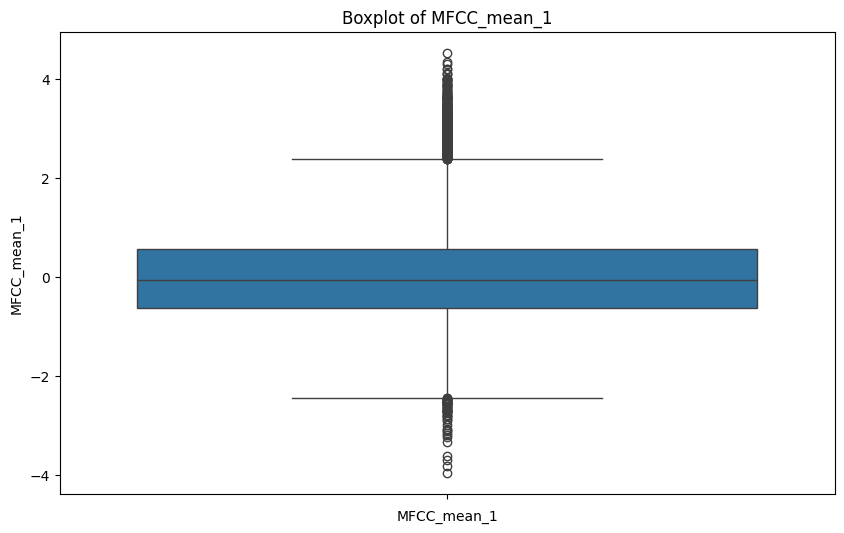

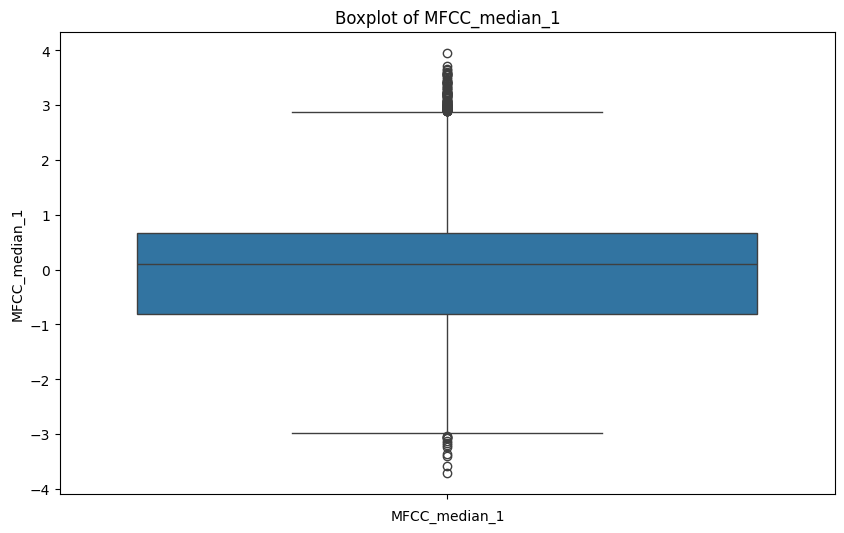

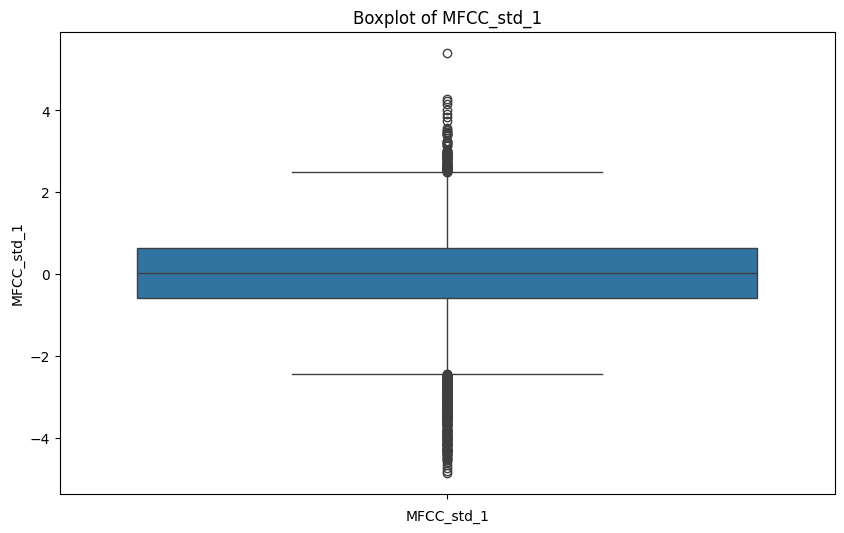

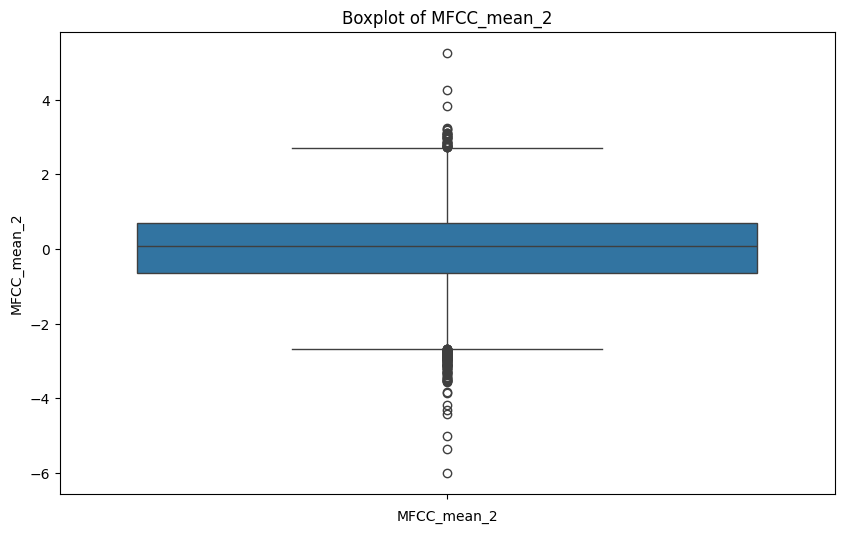

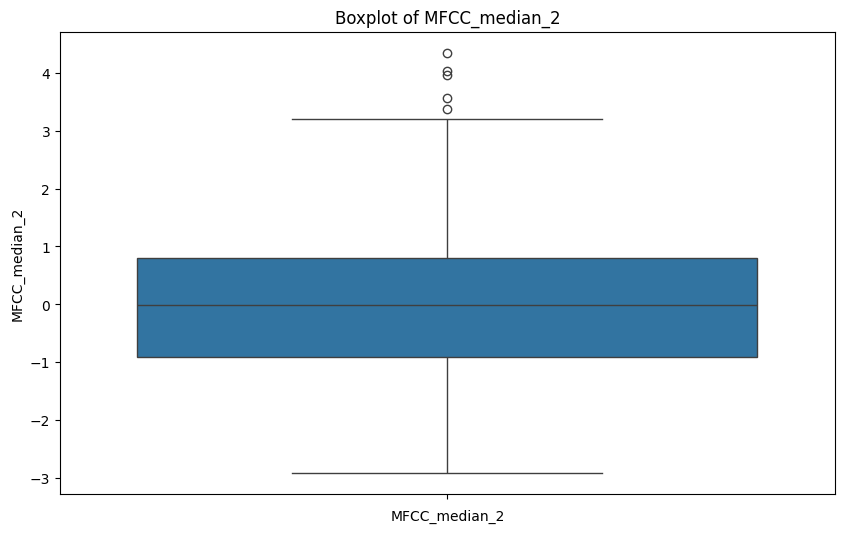

...

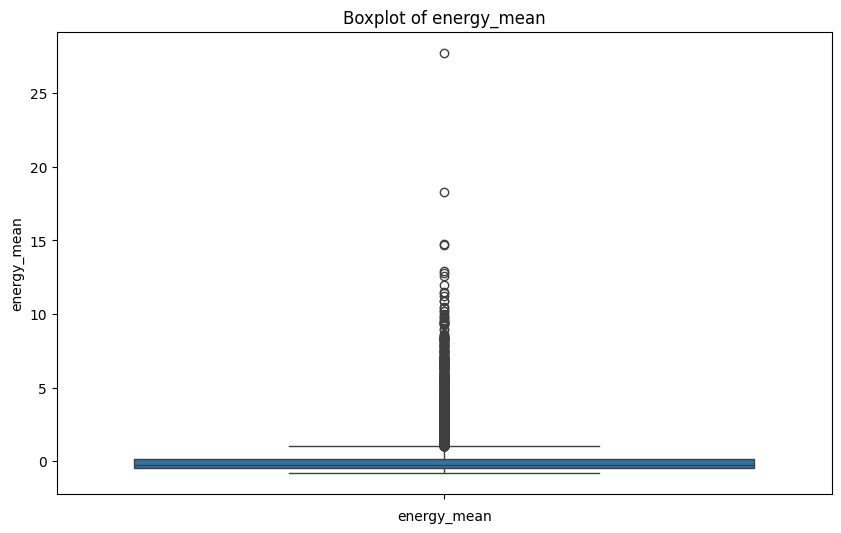

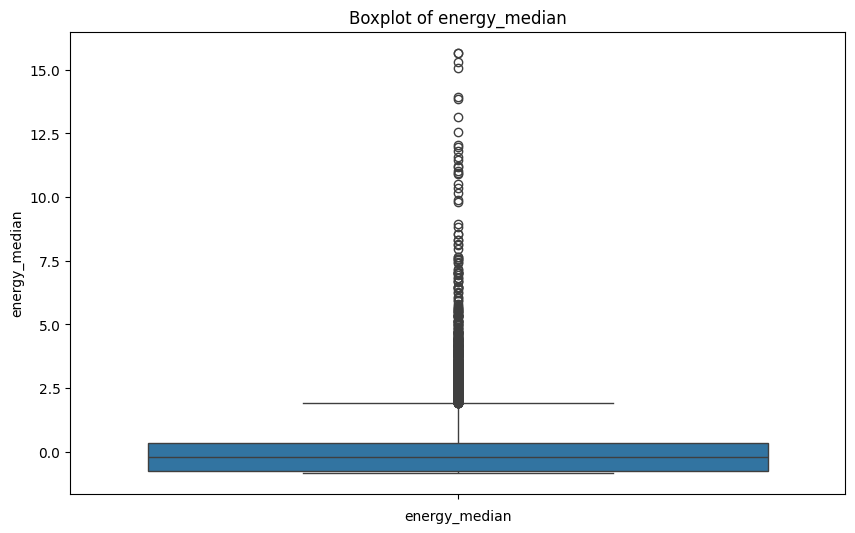

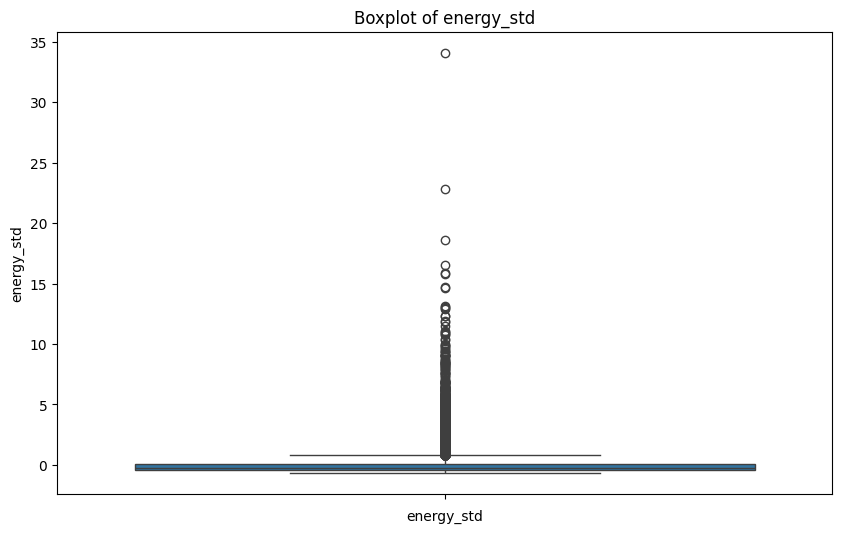

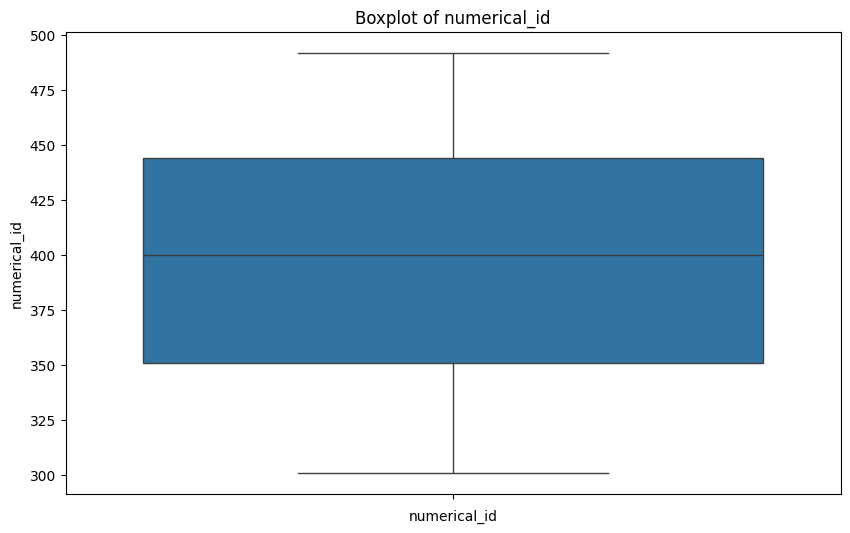

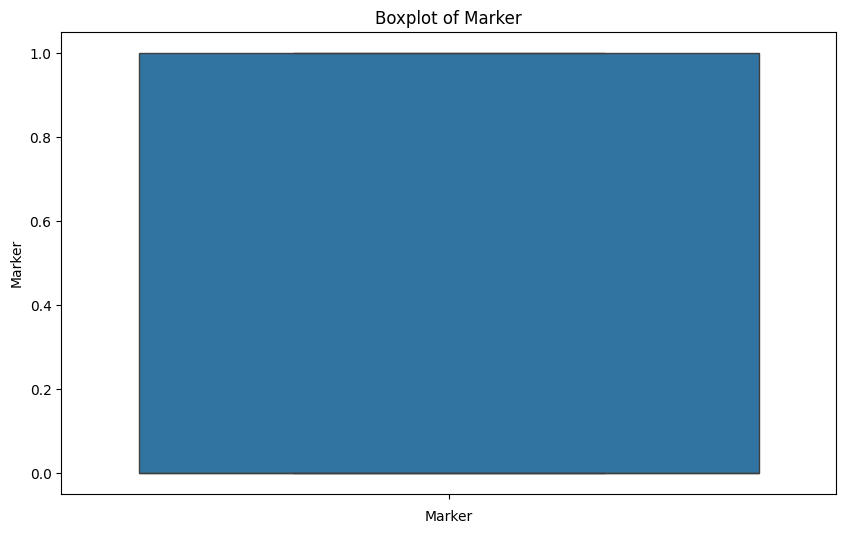

In [ ]:
## Boxplots for Outlier Detection

# Exclude non-numerical columns
numerical_features = segmented_features_df.select_dtypes(include=['number']).columns

# Boxplots for segmented features
for column in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=segmented_features_df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.show()

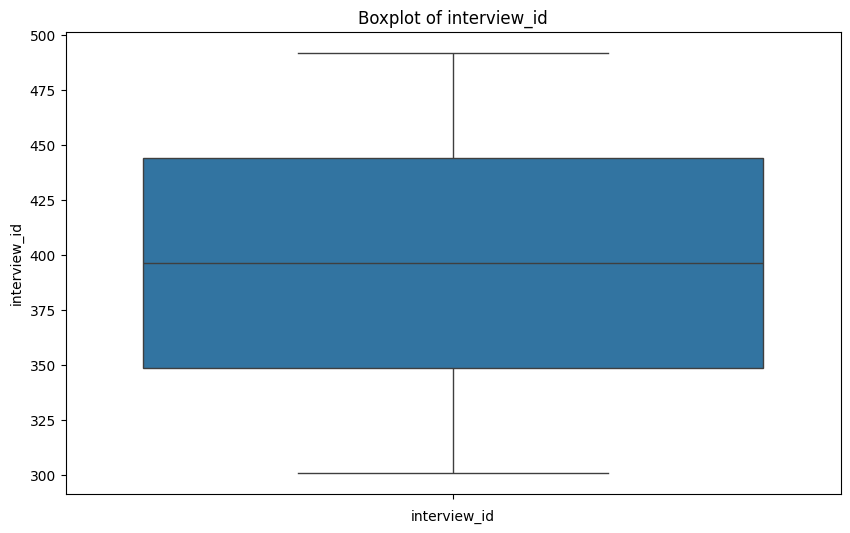

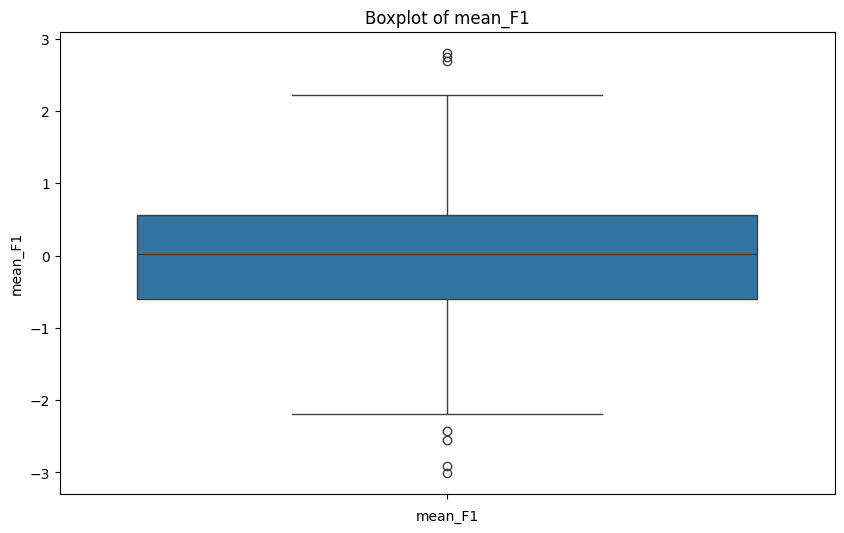

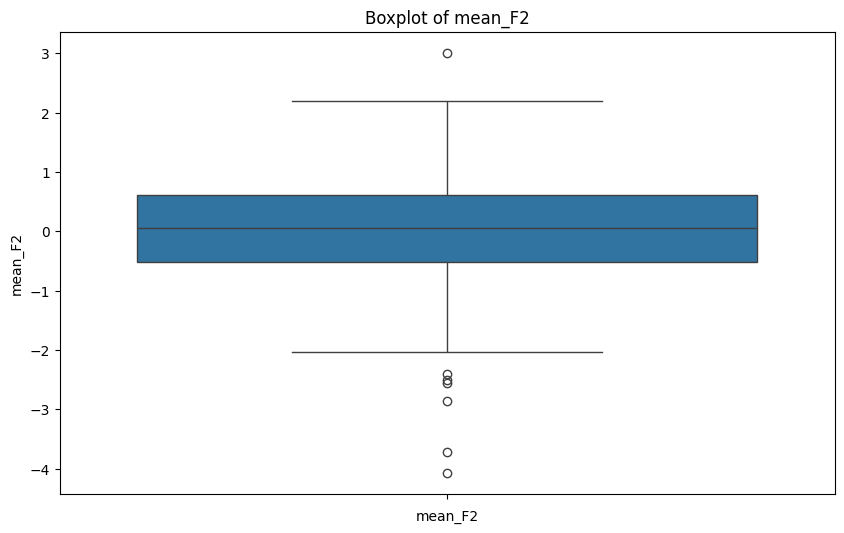

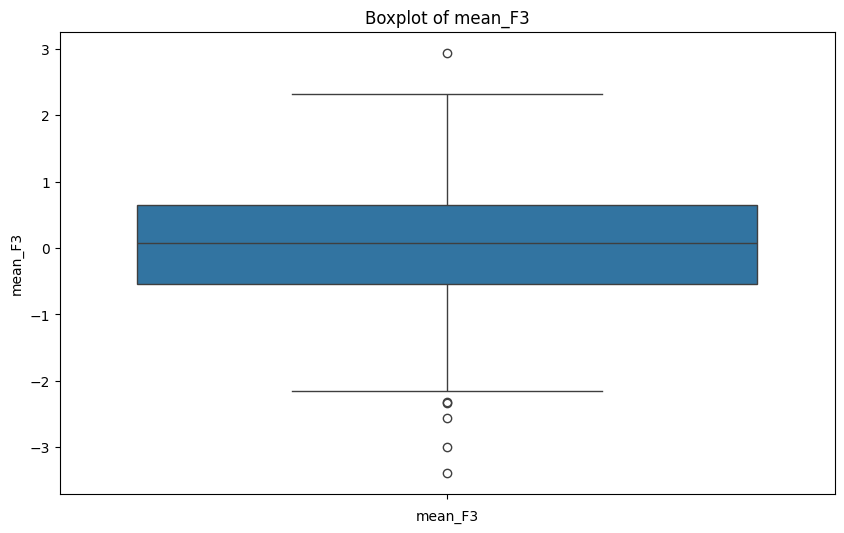

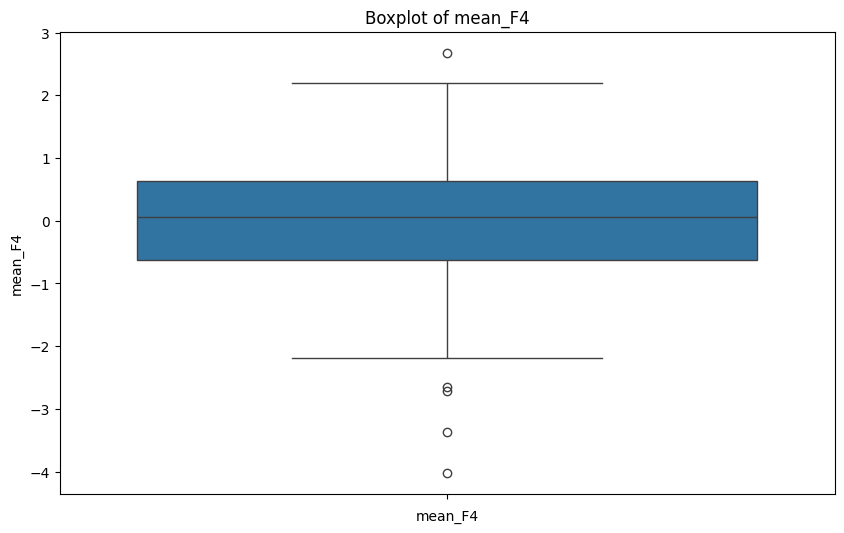

...

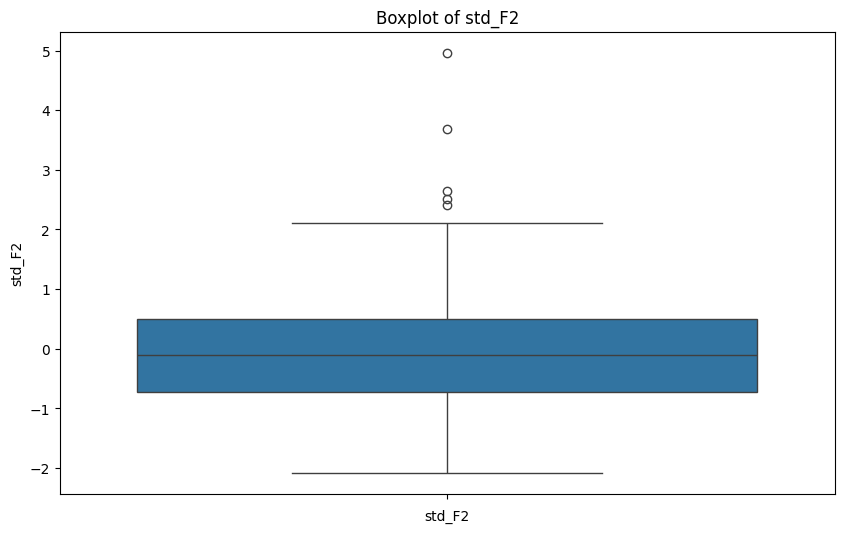

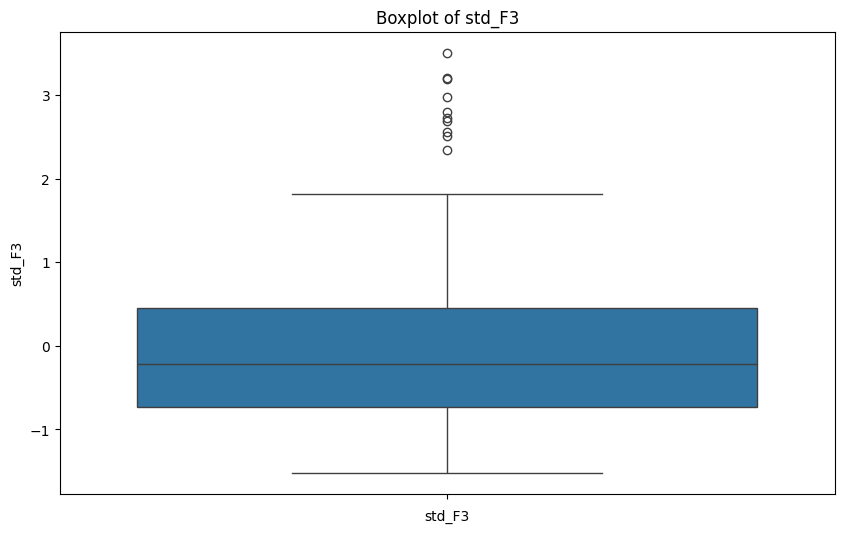

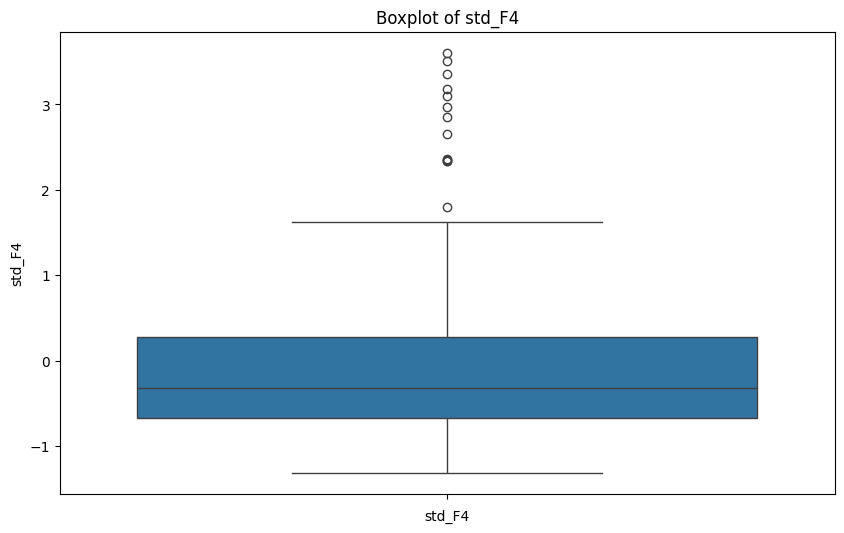

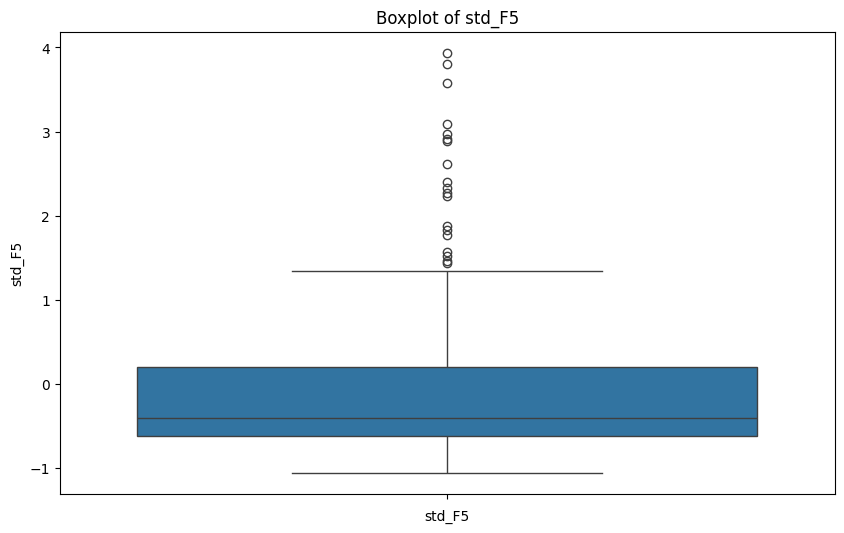

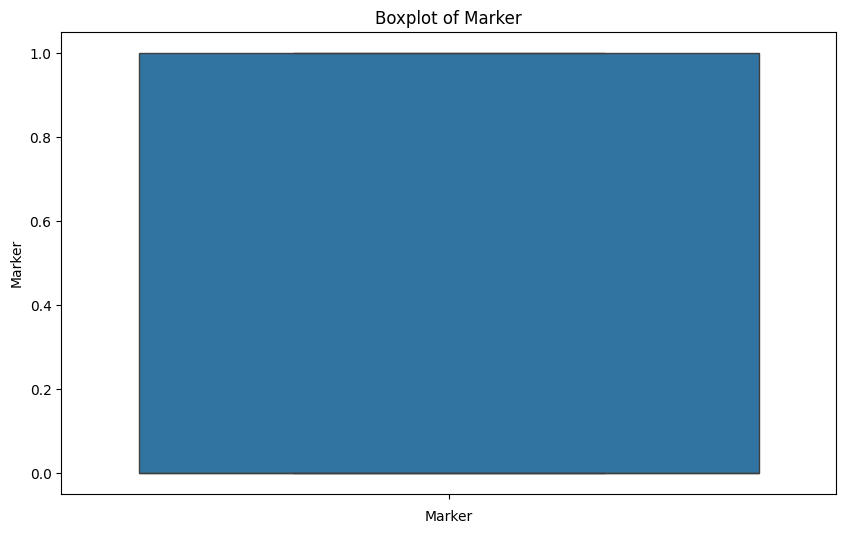

In [ ]:
## Boxplots for formant features

for column in formant_features_df.columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=formant_features_df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.show()

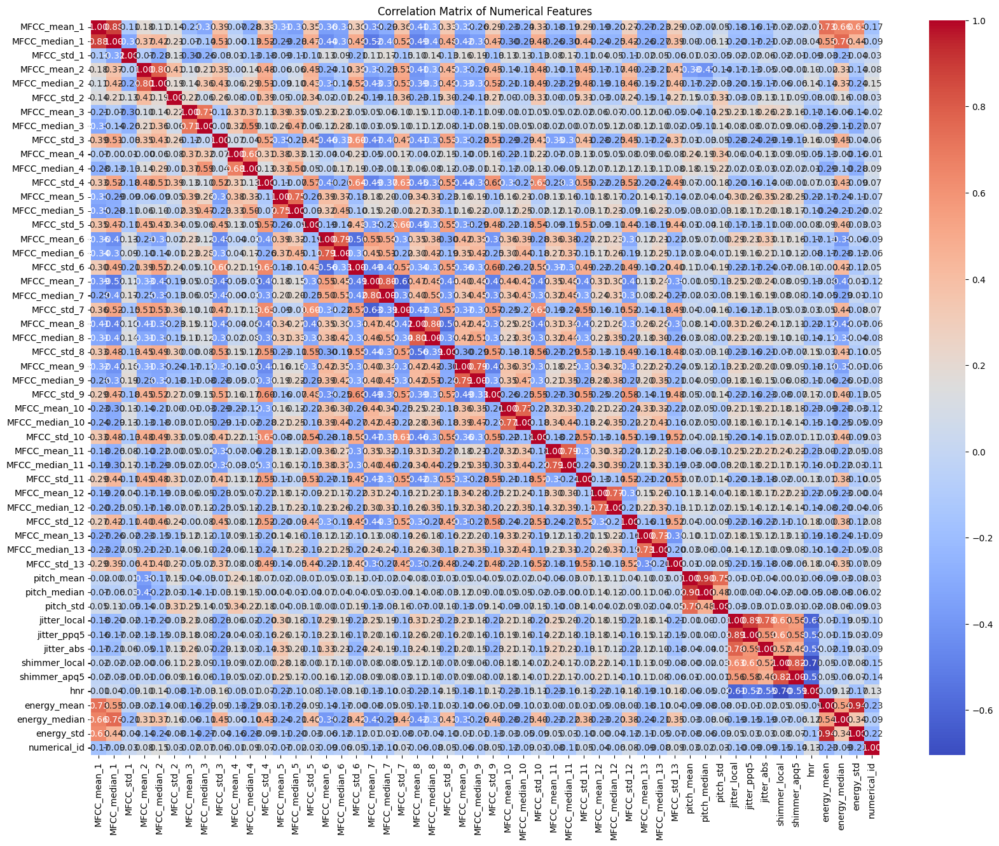

In [ ]:
## Correlation matrix for segmented features

# Exclude non-numerical columns and the target variable 'Marker'
numerical_features = segmented_features_df.select_dtypes(include=['number']).columns.drop('Marker', 'numerical_id')

# Create a correlation matrix only for numerical features
correlation_matrix = segmented_features_df[numerical_features].corr()

# Plotting the correlation matrix
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Numerical Features')
plt.show()

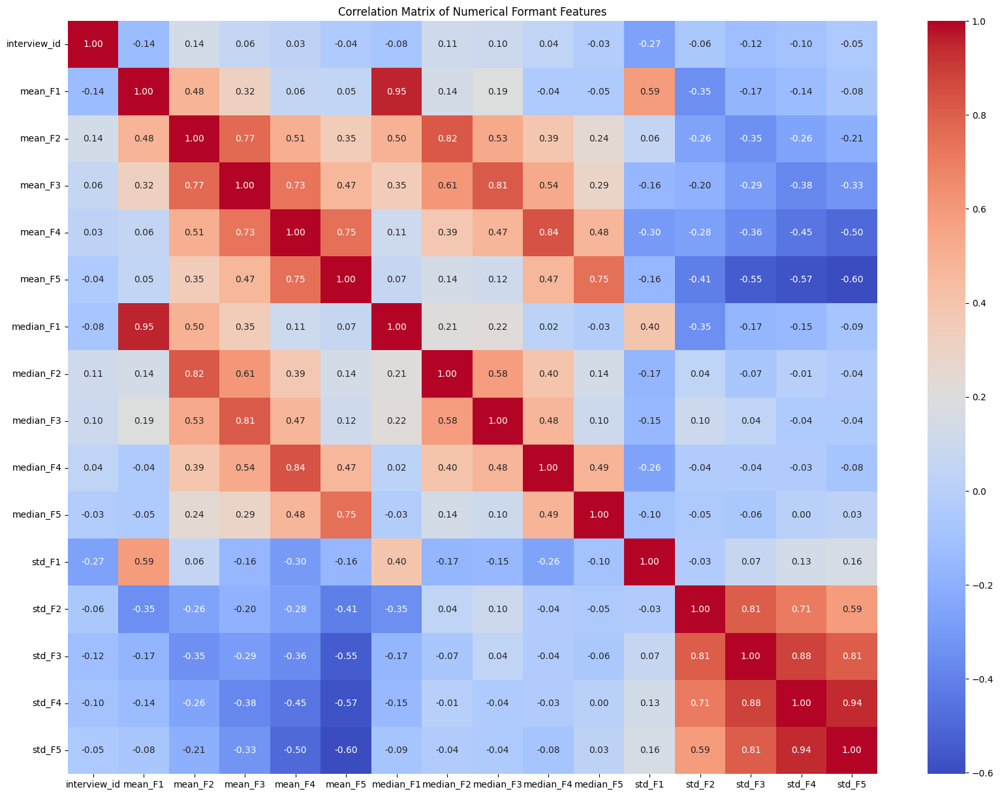

In [ ]:
## Correlation matrix for formant features

# Exclude non-numerical columns and the target variable 'Marker'
f_numerical_features = formant_features_df.select_dtypes(include=['number']).columns.drop('Marker', 'numerical_id')

# Create a correlation matrix only for numerical features
correlation_matrix = formant_features_df[f_numerical_features].corr()

# Plotting the correlation matrix
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Numerical Formant Features')
plt.show()

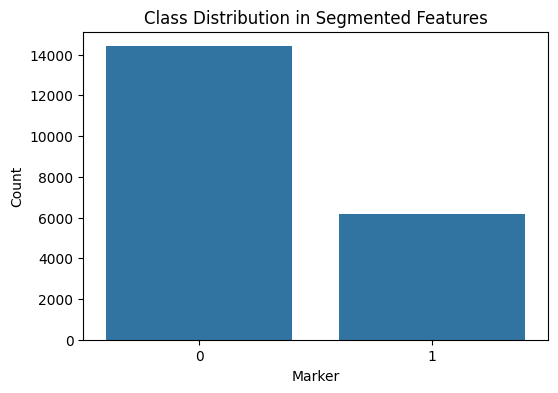

In [ ]:
## Class Distribution for segmented features

# Assuming 'Marker' is the binary label column
plt.figure(figsize=(6, 4))
sns.countplot(x='Marker', data=segmented_features_df)
plt.title('Class Distribution in Segmented Features')
plt.xlabel('Marker')
plt.ylabel('Count')
plt.show()

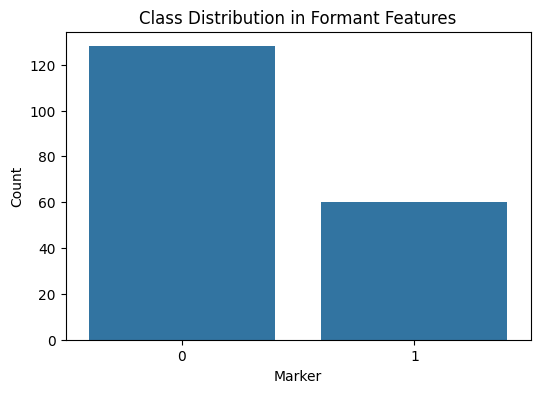

In [ ]:
## Class Distribution for formant features

# Assuming 'Marker' is the binary label column
plt.figure(figsize=(6, 4))
sns.countplot(x='Marker', data=formant_features_df)
plt.title('Class Distribution in Formant Features')
plt.xlabel('Marker')
plt.ylabel('Count')
plt.show()

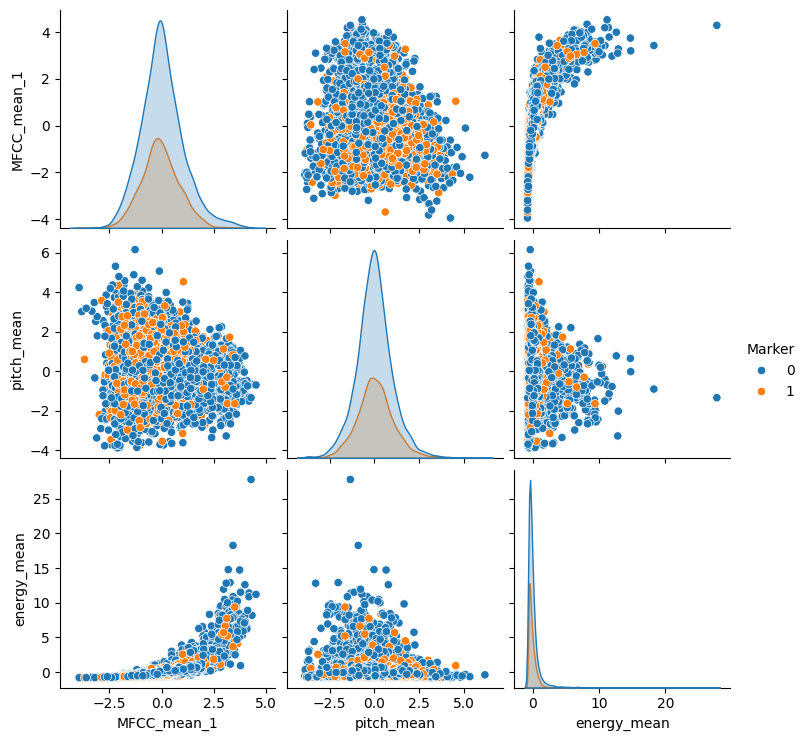

In [ ]:
## Pair Plot on segmented features

# Selecting a subset of features for a pair plot
subset = segmented_features_df[['MFCC_mean_1', 'pitch_mean', 'energy_mean', 'Marker']]
sns.pairplot(subset, hue='Marker')
plt.show()

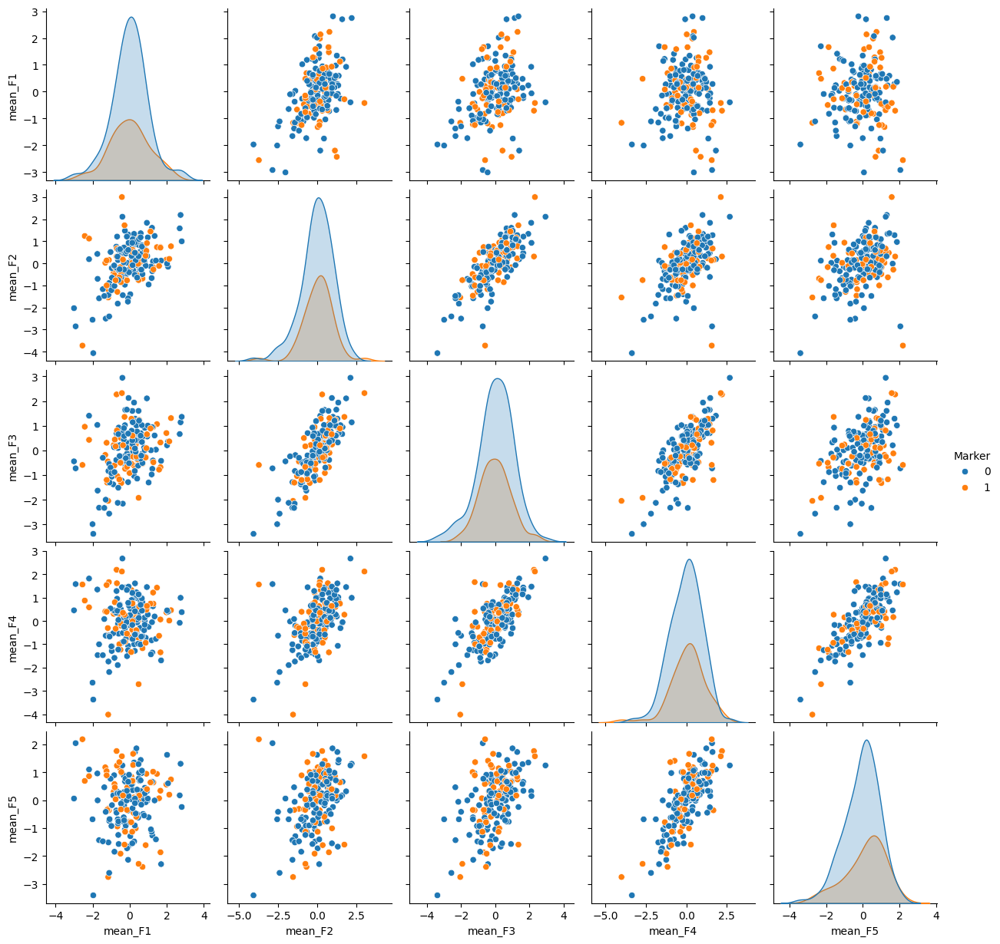

In [ ]:
## Pair Plot on formant features

# Selecting a subset of features for a pair plot
subset = formant_features_df[['mean_F1', 'mean_F2', 'mean_F3', 'mean_F4', 'mean_F5', 'Marker']]
sns.pairplot(subset, hue='Marker')
plt.show()

# Creating a complete features set + Feature Selection:

Aggregating segmented features to the interview level:

In [ ]:
pre_aggregation_df = pd.read_csv('/content/drive/My Drive/DAIC-Woz/Audio-normalized-segmented-labeled-features-FINAL.csv')

# Before aggregation, ensure 'Marker' and 'numerical_id' are associated with each 'interview_id'
markers_and_ids = pre_aggregation_df[['interview_id', 'Marker', 'numerical_id']].drop_duplicates()

# Perform the aggregation on features, excluding 'filename', 'Marker', and 'numerical_id'
aggregated_features = pre_aggregation_df.drop(columns=['filename', 'Marker', 'numerical_id']).groupby('interview_id', as_index=False).agg(['mean', 'median', 'std'])

# Flatten MultiIndex for aggregated columns and reset index to make 'interview_id' a column
aggregated_features.columns = ['_'.join(col).strip() for col in aggregated_features.columns.values]
aggregated_features.reset_index(inplace=True)

# Merge back 'Marker' and 'numerical_id' using 'interview_id'
post_aggregation_df = pd.merge(aggregated_features, markers_and_ids, on='interview_id', how='left')

# Save to CSV
post_aggregation_df.to_csv('/content/drive/My Drive/DAIC-Woz/audio_segmented_features_aggregated.csv', index=False)

Merging aggregated features with the Formant features:

In [ ]:
formant_df = pd.read_csv('/content/drive/My Drive/DAIC-Woz/Audio-normalized-labeled-formant-features-FINAL.csv')

# Ensure there's no 'Marker' column duplication
formant_df = formant_df.drop(columns=['Marker'])

# Remove the "_AUDIO_NR" suffix from the 'interview_id' in the aggregated features DataFrame
post_aggregation_df['interview_id'] = post_aggregation_df['interview_id'].str.replace('_AUDIO_NR', '')

# Since the interview_id column was formatted, the numerical_id column holds no value and can be dropped
#post_aggregation_df = post_aggregation_df.drop(columns=['numerical_id'])

# Save the changes
post_aggregation_df.to_csv('/content/drive/My Drive/DAIC-Woz/audio_segmented_features_aggregated.csv', index=False)

# Ensure both 'interview_id' columns are of the same type, converting them to strings if not already
post_aggregation_df['interview_id'] = post_aggregation_df['interview_id'].astype(str)
formant_df['interview_id'] = formant_df['interview_id'].astype(str)

# Proceed with the merge
combined_audio_features_df = pd.merge(post_aggregation_df, formant_df, on='interview_id', how='inner')

# Inspect the combined DataFrame
#print(combined_audio_features_df.head())

# Save the combned audio features set to a CSV file
combined_audio_features_df.to_csv('/content/drive/My Drive/DAIC-Woz/Audio_full_features_set_final.csv', index=False)

Feature Selection with RFECV:

In [ ]:
## 1. Using RFECV with Random Forest:

comb_df = pd.read_csv('/content/drive/My Drive/DAIC-Woz/Audio_full_features_set_final.csv')

# Preparing the data
# Extracting feature columns (exclude non-feature columns)
feature_columns = [col for col in comb_df.columns if col not in ('interview_id', 'Marker')]

X = comb_df[feature_columns]
y = comb_df['Marker']

# Re-scale features  --- uncomment the following 2 lines if desired
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)   # Adjust X, y if needed

# Initialize the base classifier
classifier = RandomForestClassifier(random_state=42)

# Initialize RFECV
selector = RFECV(estimator=classifier, step=1, cv=5, scoring='accuracy')  # Adjust cv and scoring as needed

# Fit RFECV
selector.fit(X_train, y_train)

# Transform training and testing sets so they only include important features
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

# Re-train the classifier using the selected features
classifier.fit(X_train_selected, y_train)

# Predict on the test set with the selected features
y_pred = classifier.predict(X_test_selected)

# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Model accuracy with selected features: {accuracy}")

# Print the number of selected features
print(f"Number of selected features: {selector.n_features_}")

# Get the mask of selected features - True for selected features
selected_feature_names = [feature for feature, selected in zip(feature_columns, selector.support_) if selected]
print(f"Selected features: {selected_feature_names}")

Model accuracy with selected features: 0.5
Number of selected features: 37
Selected features: ['MFCC_median_3_std', 'MFCC_median_4_median', 'MFCC_median_4_std', 'MFCC_median_5_mean', 'MFCC_median_5_std', 'MFCC_median_6_std', 'MFCC_mean_7_std', 'MFCC_median_7_std', 'MFCC_median_8_std', 'MFCC_mean_9_mean', 'MFCC_mean_9_median', 'MFCC_mean_9_std', 'MFCC_std_9_std', 'MFCC_mean_11_mean', 'MFCC_mean_11_median', 'MFCC_std_11_mean', 'MFCC_std_11_std', 'MFCC_std_12_median', 'MFCC_std_12_std', 'MFCC_mean_13_mean', 'MFCC_mean_13_median', 'MFCC_std_13_mean', 'MFCC_std_13_std', 'pitch_mean_median', 'pitch_std_mean', 'pitch_std_median', 'jitter_local_std', 'jitter_abs_std', 'shimmer_local_std', 'hnr_std', 'mean_F5', 'median_F1', 'median_F2', 'std_F1', 'std_F2', 'std_F3', 'std_F5']


In [ ]:
## 2. Using RFECV with Logistic Regression:

# Assume X_train, X_test, y_train, y_test are the same

# Initialize the base classifier with Logistic Regression
classifier = LogisticRegression(random_state=42, max_iter=1000)

# Initialize RFECV with Logistic Regression
selector = RFECV(estimator=classifier, step=1, cv=5, scoring='accuracy')  # Adjust cv and scoring as needed

# Fit RFECV
selector.fit(X_train, y_train)

# Transform training and testing sets so they only include important features
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

# Re-train the classifier using the selected features
classifier.fit(X_train_selected, y_train)

# Predict on the test set with the selected features
y_pred = classifier.predict(X_test_selected)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Model accuracy with selected features: {accuracy}")

# Print the number of selected features
print(f"Number of selected features: {selector.n_features_}")

# Get the mask of selected features - True for selected features
selected_feature_names = [feature for feature, selected in zip(feature_columns, selector.support_) if selected]
print(f"Selected features: {selected_feature_names}")

Model accuracy with selected features: 0.5789473684210527
Number of selected features: 1
Selected features: ['MFCC_median_7_median']


Feature Selection with RFE:

In [ ]:
## RFE with Logistic Regression:

# Load the audio features dataset
audio_df = pd.read_csv('/content/drive/My Drive/DAIC-Woz/Audio_full_features_set_final.csv')

# Selecting features by excluding non-feature columns
# Exclude any non-feature column
feature_columns = audio_df.columns.drop(['interview_id', 'Marker'])  # Adjust column names as needed
X = audio_df[feature_columns]
y = audio_df['Marker']

# Optional: Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Create a logistic regression classifier as the base model for RFE
model = LogisticRegression(max_iter=1000)

# Initialize RFE with the chosen model
rfe = RFE(estimator=model, n_features_to_select=10)  # Adjust n_features_to_select

# Fit RFE
fit = rfe.fit(X_scaled, y)    # with scaling
#fit = rfe.fit(X, y)          # w/o scaling

# Print the features selected by RFE
selected_features_bool = fit.support_
selected_features = [feature for feature, selected in zip(feature_columns, selected_features_bool) if selected]
print('Selected features:')
for feature in selected_features:
    print(feature)

Selected features:
MFCC_median_3_std
MFCC_median_6_std
MFCC_median_9_mean
MFCC_median_9_median
shimmer_apq5_mean
shimmer_apq5_std
energy_mean_std
energy_median_mean
energy_std_mean
std_F1


In [ ]:
## RFE with Random Forest:

# Assume the same X, y values as above

# Optional: Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# RandomForestClassifier as the base model
model = RandomForestClassifier(random_state=42)

# Initialize RFE with the chosen model
rfe = RFE(estimator=model, n_features_to_select=20)  # Adjust n_features_to_select

# Fit RFE
fit = rfe.fit(X_scaled, y)
# fit = rfe.fit(X, y)

# Print the features selected by RFE
selected_features_bool = fit.support_
selected_features = [feature for feature, selected in zip(feature_columns, selected_features_bool) if selected]
print('Selected features:')
for feature in selected_features:
    print(feature)

Selected features:
MFCC_mean_3_std
MFCC_median_3_std
MFCC_median_4_mean
MFCC_median_4_median
MFCC_mean_11_median
MFCC_mean_11_std
MFCC_std_11_std
MFCC_mean_13_mean
MFCC_mean_13_median
pitch_mean_median
pitch_median_mean
pitch_std_mean
pitch_std_median
jitter_local_std
shimmer_local_std
hnr_std
median_F1
std_F1
std_F2
std_F5


Top Features selected across all selectors:

In [ ]:
#  `all_features` involves all the features selected by the various feature selectors (including duplicates)
all_features = [
    'MFCC_median_3_std', 'MFCC_median_4_median', 'MFCC_median_4_std', 'MFCC_median_5_mean', 'MFCC_median_5_std', 'MFCC_median_6_std', 'MFCC_mean_7_std',
    'MFCC_median_7_std', 'MFCC_median_8_std', 'MFCC_mean_9_mean', 'MFCC_mean_9_median', 'MFCC_mean_9_std', 'MFCC_std_9_std', 'MFCC_mean_11_mean',
    'MFCC_mean_11_median', 'MFCC_std_11_mean', 'MFCC_std_11_std', 'MFCC_std_12_median', 'MFCC_std_12_std', 'MFCC_mean_13_mean', 'MFCC_mean_13_median',
    'MFCC_std_13_mean', 'MFCC_std_13_std', 'pitch_mean_median', 'pitch_std_mean', 'pitch_std_median', 'jitter_local_std', 'jitter_abs_std', 'shimmer_local_std',
    'hnr_std', 'mean_F5', 'median_F1', 'median_F2', 'std_F1', 'std_F2', 'std_F3', 'std_F5', 'MFCC_median_2_mean', 'MFCC_mean_3_std', 'MFCC_median_3_std', 'MFCC_std_3_median', 'MFCC_median_8_std', 'MFCC_median_9_median', 'MFCC_median_10_std',
    'shimmer_apq5_std', 'energy_mean_median', 'std_F1', 'MFCC_mean_1_median', 'MFCC_std_1_std', 'MFCC_median_2_mean', 'MFCC_mean_3_std', 'MFCC_median_3_std', 'MFCC_std_3_median', 'MFCC_median_6_std', 'MFCC_std_7_std',
    'MFCC_median_8_std', 'MFCC_median_9_median', 'MFCC_median_10_std', 'shimmer_apq5_std', 'energy_mean_median', 'energy_median_mean', 'std_F1', 'MFCC_mean_1_median', 'MFCC_std_1_std', 'MFCC_median_2_mean', 'MFCC_mean_3_std', 'MFCC_median_3_std', 'MFCC_std_3_median', 'MFCC_median_6_std', 'MFCC_median_7_median',
    'MFCC_std_7_std', 'MFCC_mean_8_median', 'MFCC_median_8_std', 'MFCC_std_8_median', 'MFCC_median_9_median', 'MFCC_median_10_std', 'MFCC_std_12_median', 'shimmer_apq5_std',
    'energy_mean_median', 'energy_median_mean', 'energy_std_mean', 'std_F1', 'MFCC_median_3_std', 'MFCC_median_6_std', 'MFCC_median_9_mean', 'MFCC_median_9_median', 'shimmer_apq5_mean', 'shimmer_apq5_std', 'energy_mean_std', 'energy_median_mean',
    'energy_std_mean', 'std_F1', 'MFCC_median_3_std', 'MFCC_median_6_std', 'MFCC_std_6_mean', 'MFCC_median_9_mean', 'MFCC_median_9_median', 'MFCC_std_9_median', 'shimmer_apq5_mean', 'shimmer_apq5_std',
    'energy_mean_std', 'energy_median_mean', 'energy_std_mean', 'mean_F3', 'mean_F5', 'median_F1', 'std_F1', 'MFCC_std_1_std', 'MFCC_std_2_std', 'MFCC_median_3_std', 'MFCC_median_6_std', 'MFCC_std_6_mean', 'MFCC_mean_8_std', 'MFCC_std_8_median', 'MFCC_median_9_mean',
    'MFCC_median_9_median', 'MFCC_std_9_median', 'MFCC_mean_11_median', 'shimmer_apq5_mean', 'shimmer_apq5_std', 'energy_mean_std', 'energy_median_mean',
    'energy_std_mean', 'mean_F3', 'mean_F5', 'median_F1', 'std_F1', 'MFCC_median_4_mean', 'MFCC_std_11_std', 'MFCC_mean_13_median', 'pitch_std_mean', 'pitch_std_median', 'shimmer_local_std', 'hnr_std', 'median_F1', 'std_F1', 'std_F5',
    'MFCC_median_4_mean', 'MFCC_median_4_median', 'MFCC_mean_11_median', 'MFCC_mean_11_std', 'MFCC_std_11_std', 'MFCC_mean_13_mean', 'MFCC_mean_13_median', 'pitch_std_mean',
    'pitch_std_median', 'shimmer_local_std', 'hnr_std', 'median_F1', 'std_F1', 'std_F2', 'std_F5', 'MFCC_mean_3_std', 'MFCC_median_3_std', 'MFCC_median_4_mean', 'MFCC_median_4_median', 'MFCC_mean_11_median', 'MFCC_mean_11_std', 'MFCC_std_11_std', 'MFCC_mean_13_mean',
    'MFCC_mean_13_median', 'pitch_mean_median', 'pitch_median_mean', 'pitch_std_mean', 'pitch_std_median', 'jitter_local_std', 'shimmer_local_std', 'hnr_std', 'median_F1',
    'std_F1', 'std_F2', 'std_F5'
]

# Count the occurrences of each feature
feature_counts = Counter(all_features)

# Get the top 10 most common features
top_15_features = feature_counts.most_common(15)

print(top_15_features)

[('std_F1', 10), ('MFCC_median_3_std', 8), ('MFCC_median_6_std', 6), ('median_F1', 6), ('MFCC_median_9_median', 6), ('shimmer_apq5_std', 6), ('energy_median_mean', 5), ('MFCC_median_8_std', 4), ('MFCC_mean_11_median', 4), ('MFCC_std_11_std', 4), ('MFCC_mean_13_median', 4), ('pitch_std_mean', 4), ('pitch_std_median', 4), ('shimmer_local_std', 4), ('hnr_std', 4)]


# Modeling:

Creating the feature sets based on various selectors:

In [ ]:
## Creating feature set dataframes for model experimentation and visualization

# Load the audio features dataset
audio_df = pd.read_csv('/content/drive/My Drive/DAIC-Woz/Audio_full_features_set_final.csv')

## Define audio features here based on selection
# 1. RFECV with Random Forest:    (same with and without the rescaling)
rfecv_rf_37 = [
    'MFCC_median_3_std', 'MFCC_median_4_median', 'MFCC_median_4_std', 'MFCC_median_5_mean', 'MFCC_median_5_std', 'MFCC_median_6_std', 'MFCC_mean_7_std',
    'MFCC_median_7_std', 'MFCC_median_8_std', 'MFCC_mean_9_mean', 'MFCC_mean_9_median', 'MFCC_mean_9_std', 'MFCC_std_9_std', 'MFCC_mean_11_mean',
    'MFCC_mean_11_median', 'MFCC_std_11_mean', 'MFCC_std_11_std', 'MFCC_std_12_median', 'MFCC_std_12_std', 'MFCC_mean_13_mean', 'MFCC_mean_13_median',
    'MFCC_std_13_mean', 'MFCC_std_13_std', 'pitch_mean_median', 'pitch_std_mean', 'pitch_std_median', 'jitter_local_std', 'jitter_abs_std', 'shimmer_local_std',
    'hnr_std', 'mean_F5', 'median_F1', 'median_F2', 'std_F1', 'std_F2', 'std_F3', 'std_F5'
]

# 2. RFE with Logistic Regression:    without rescaling
rfe_logreg_10 = [
    'MFCC_median_2_mean', 'MFCC_mean_3_std', 'MFCC_median_3_std', 'MFCC_std_3_median', 'MFCC_median_8_std', 'MFCC_median_9_median', 'MFCC_median_10_std',
    'shimmer_apq5_std', 'energy_mean_median', 'std_F1'
]

rfe_logreg_15 = [
    'MFCC_mean_1_median', 'MFCC_std_1_std', 'MFCC_median_2_mean', 'MFCC_mean_3_std', 'MFCC_median_3_std', 'MFCC_std_3_median', 'MFCC_median_6_std', 'MFCC_std_7_std',
    'MFCC_median_8_std', 'MFCC_median_9_median', 'MFCC_median_10_std', 'shimmer_apq5_std', 'energy_mean_median', 'energy_median_mean', 'std_F1'
]

rfe_logreg_20 = [
    'MFCC_mean_1_median', 'MFCC_std_1_std', 'MFCC_median_2_mean', 'MFCC_mean_3_std', 'MFCC_median_3_std', 'MFCC_std_3_median', 'MFCC_median_6_std', 'MFCC_median_7_median',
    'MFCC_std_7_std', 'MFCC_mean_8_median', 'MFCC_median_8_std', 'MFCC_std_8_median', 'MFCC_median_9_median', 'MFCC_median_10_std', 'MFCC_std_12_median', 'shimmer_apq5_std',
    'energy_mean_median', 'energy_median_mean', 'energy_std_mean', 'std_F1'
]

# 3. RFE with Logistic Regression:   with rescaling
rfe_logreg_10r = [
    'MFCC_median_3_std', 'MFCC_median_6_std', 'MFCC_median_9_mean', 'MFCC_median_9_median', 'shimmer_apq5_mean', 'shimmer_apq5_std', 'energy_mean_std', 'energy_median_mean',
    'energy_std_mean', 'std_F1'
]

rfe_logreg_15r = [
    'MFCC_median_3_std', 'MFCC_median_6_std', 'MFCC_std_6_mean', 'MFCC_median_9_mean', 'MFCC_median_9_median', 'MFCC_std_9_median', 'shimmer_apq5_mean', 'shimmer_apq5_std',
    'energy_mean_std', 'energy_median_mean', 'energy_std_mean', 'mean_F3', 'mean_F5', 'median_F1', 'std_F1'
]

rfe_logreg_20r = [
    'MFCC_std_1_std', 'MFCC_std_2_std', 'MFCC_median_3_std', 'MFCC_median_6_std', 'MFCC_std_6_mean', 'MFCC_mean_8_std', 'MFCC_std_8_median', 'MFCC_median_9_mean',
    'MFCC_median_9_median', 'MFCC_std_9_median', 'MFCC_mean_11_median', 'shimmer_apq5_mean', 'shimmer_apq5_std', 'energy_mean_std', 'energy_median_mean',
    'energy_std_mean', 'mean_F3', 'mean_F5', 'median_F1', 'std_F1'
]

# 4. RFE with Random Forest:    (same with and without rescaling)
rfe_rf_10 = [
    'MFCC_median_4_mean', 'MFCC_std_11_std', 'MFCC_mean_13_median', 'pitch_std_mean', 'pitch_std_median', 'shimmer_local_std', 'hnr_std', 'median_F1', 'std_F1', 'std_F5'
]

rfe_rf_15 = [
    'MFCC_median_4_mean', 'MFCC_median_4_median', 'MFCC_mean_11_median', 'MFCC_mean_11_std', 'MFCC_std_11_std', 'MFCC_mean_13_mean', 'MFCC_mean_13_median', 'pitch_std_mean',
    'pitch_std_median', 'shimmer_local_std', 'hnr_std', 'median_F1', 'std_F1', 'std_F2', 'std_F5'
]

rfe_rf_20 = [
    'MFCC_mean_3_std', 'MFCC_median_3_std', 'MFCC_median_4_mean', 'MFCC_median_4_median', 'MFCC_mean_11_median', 'MFCC_mean_11_std', 'MFCC_std_11_std', 'MFCC_mean_13_mean',
    'MFCC_mean_13_median', 'pitch_mean_median', 'pitch_median_mean', 'pitch_std_mean', 'pitch_std_median', 'jitter_local_std', 'shimmer_local_std', 'hnr_std', 'median_F1',
    'std_F1', 'std_F2', 'std_F5'
]


Evaluating the feature selections with all the models using CV:

In [ ]:
# Load the audio features dataset
audio_df = pd.read_csv('/content/drive/My Drive/DAIC-Woz/Audio_full_features_set_final.csv')

audio_features = [    # This is an example df. Any of the above features set dataframes can be used here for model evaluation
    'MFCC_median_4_mean', 'MFCC_std_11_std', 'MFCC_mean_13_median', 'pitch_std_mean', 'pitch_std_median', 'shimmer_local_std', 'hnr_std', 'median_F1', 'std_F1', 'std_F5'
]

X = audio_df[audio_features]
y = audio_df['Marker']

# Define the K-fold Cross Validator
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate Logistic Regression
def evaluate_feature_subset_lr(feature_subset):
    X_subset = X[feature_subset]
    model = LogisticRegression(max_iter=1000)
    # Predict across the cross-validated folds
    y_pred = cross_val_predict(model, X_subset, y, cv=kfold)
    # Generate the classification report
    report = classification_report(y, y_pred)
    cv_scores_auc = cross_val_score(model, X_subset, y, cv=kfold, scoring='roc_auc')
    cv_scores_acc = cross_val_score(model, X_subset, y, cv=kfold, scoring='accuracy')
    print(f"Logistic Regression - Features: {len(feature_subset)}")
    print(f"Mean CV AUC-ROC: {np.mean(cv_scores_auc):.4f}")
    print(f"Mean CV Accuracy: {np.mean(cv_scores_acc):.4f}\n")
    print(f"Classification Report:\n{report}")

# Evaluate SVM
def evaluate_feature_subset_svm(feature_subset):
    X_subset = X[feature_subset]
    model = SVC(kernel='linear', probability=True, random_state=42)
    y_pred = cross_val_predict(model, X_subset, y, cv=kfold)
    report = classification_report(y, y_pred)
    cv_scores_auc = cross_val_score(model, X_subset, y, cv=kfold, scoring='roc_auc')
    cv_scores_acc = cross_val_score(model, X_subset, y, cv=kfold, scoring='accuracy')
    print(f"SVM - Features: {len(feature_subset)}")
    print(f"Mean CV AUC-ROC: {np.mean(cv_scores_auc):.4f}")
    print(f"Mean CV Accuracy: {np.mean(cv_scores_acc):.4f}\n")
    print(f"Classification Report:\n{report}")

# Evaluate Random Forest
def evaluate_feature_subset_rf(feature_subset):
    X_subset = X[feature_subset]
    model = RandomForestClassifier(random_state=42)
    y_pred = cross_val_predict(model, X_subset, y, cv=kfold)
    report = classification_report(y, y_pred)
    cv_scores_auc = cross_val_score(model, X_subset, y, cv=kfold, scoring='roc_auc')
    cv_scores_acc = cross_val_score(model, X_subset, y, cv=kfold, scoring='accuracy')
    print(f"Random Forest - Features: {len(feature_subset)}")
    print(f"Mean CV AUC-ROC: {np.mean(cv_scores_auc):.4f}")
    print(f"Mean CV Accuracy: {np.mean(cv_scores_acc):.4f}\n")
    print(f"Classification Report:\n{report}")

# Evaluate Dense Layers
def evaluate_feature_subset_dl(feature_subset):
    X_subset = X[feature_subset].values  # Ensure NumPy array format for Keras
    auc_roc_per_fold = []
    acc_per_fold = []
    y_true = []
    y_pred = []

    for train, test in kfold.split(X_subset, y):
        model = Sequential([
            Dense(64, activation='relu', input_shape=(len(feature_subset),)),
            Dense(32, activation='relu'),
            Dense(1, activation='sigmoid')
        ])
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        model.fit(X_subset[train], y.iloc[train].values, epochs=50, batch_size=32, verbose=0)
        # Store true and predicted values for classification report
        y_true.extend(y[test])
        y_pred_probs = model.predict(X_subset[test]).ravel()
        y_pred.extend(y_pred_probs >= 0.5)
        # Evaluate the model
        scores = model.evaluate(X_subset[test], y[test], verbose=0)
        acc_per_fold.append(scores[1] * 100)
        auc_roc = roc_auc_score(y[test], y_pred_probs)
        auc_roc_per_fold.append(auc_roc)

    print(f"Dense Layers - Features: {len(feature_subset)}")
    print(f"Mean CV AUC-ROC: {np.mean(auc_roc_per_fold):.4f}")
    print(f"Mean CV Accuracy: {np.mean(acc_per_fold):.2f}%\n")

    # Generate classification report
    print("Classification Report:")
    print(classification_report(y_true, y_pred))

# Usage for a specific set of features
evaluate_feature_subset_lr(audio_features)
evaluate_feature_subset_svm(audio_features)
evaluate_feature_subset_rf(audio_features)
evaluate_feature_subset_dl(audio_features)

Logistic Regression - Features: 10
Mean CV AUC-ROC: 0.5912
Mean CV Accuracy: 0.6862

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.95      0.80       128
           1       0.53      0.13      0.21        60

    accuracy                           0.69       188
   macro avg       0.62      0.54      0.51       188
weighted avg       0.65      0.69      0.62       188



/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


SVM - Features: 10
Mean CV AUC-ROC: 0.5768
Mean CV Accuracy: 0.6808

Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81       128
           1       0.00      0.00      0.00        60

    accuracy                           0.68       188
   macro avg       0.34      0.50      0.41       188
weighted avg       0.46      0.68      0.55       188

Random Forest - Features: 10
Mean CV AUC-ROC: 0.7456
Mean CV Accuracy: 0.7077

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.86      0.80       128
           1       0.56      0.38      0.46        60

    accuracy                           0.71       188
   macro avg       0.65      0.62      0.63       188
weighted avg       0.69      0.71      0.69       188



/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../keras/src/layers/core/dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../keras/src/layers/core/dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../keras/src/layers/core/dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../keras/src/layers/core/dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../keras/src/layers/core/dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Dense Layers - Features: 10
Mean CV AUC-ROC: 0.7003
Mean CV Accuracy: 68.59%

Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.88      0.79       128
           1       0.52      0.28      0.37        60

    accuracy                           0.69       188
   macro avg       0.62      0.58      0.58       188
weighted avg       0.66      0.69      0.66       188



# Overfitting testing:

In [ ]:
## Logistic Regression overfitting check

# Assume any of the above features set dataframes
X = audio_df[rfe_rf_10]
y = audio_df['Marker']

# Define the K-fold Cross Validator
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Adjusted Logistic Regression Evaluation Function
def evaluate_feature_subset_lr_with_fold_scores(feature_subset):
    X_subset = X[feature_subset]
    model = LogisticRegression(max_iter=1000)

    # Use cross_validate to get scores for each fold
    cv_results = cross_validate(model, X_subset, y, cv=kfold, scoring=['roc_auc', 'accuracy'], return_train_score=True)

    # Print scores for each fold
    print(f"Logistic Regression - Features: {len(feature_subset)}")
    for i, (train_score, test_score) in enumerate(zip(cv_results['train_roc_auc'], cv_results['test_roc_auc']), start=1):
        print(f"Fold {i} - Train ROC-AUC: {train_score:.4f}, Test ROC-AUC: {test_score:.4f}")
    for i, (train_score, test_score) in enumerate(zip(cv_results['train_accuracy'], cv_results['test_accuracy']), start=1):
        print(f"Fold {i} - Train Accuracy: {train_score:.4f}, Test Accuracy: {test_score:.4f}")

    # Average scores across all folds for a summary
    print(f"\nMean CV Train ROC-AUC: {np.mean(cv_results['train_roc_auc']):.4f}")
    print(f"Mean CV Test ROC-AUC: {np.mean(cv_results['test_roc_auc']):.4f}")
    print(f"Mean CV Train Accuracy: {np.mean(cv_results['train_accuracy']):.4f}")
    print(f"Mean CV Test Accuracy: {np.mean(cv_results['test_accuracy']):.4f}\n")

evaluate_feature_subset_lr_with_fold_scores(rfe_rf_10) # adjust feature_subset accordingly

Logistic Regression - Features: 10
Fold 1 - Train ROC-AUC: 0.6775, Test ROC-AUC: 0.5994
Fold 2 - Train ROC-AUC: 0.6814, Test ROC-AUC: 0.5513
Fold 3 - Train ROC-AUC: 0.6738, Test ROC-AUC: 0.6218
Fold 4 - Train ROC-AUC: 0.7237, Test ROC-AUC: 0.4733
Fold 5 - Train ROC-AUC: 0.6353, Test ROC-AUC: 0.7100
Fold 1 - Train Accuracy: 0.6800, Test Accuracy: 0.7632
Fold 2 - Train Accuracy: 0.7000, Test Accuracy: 0.6316
Fold 3 - Train Accuracy: 0.7200, Test Accuracy: 0.6579
Fold 4 - Train Accuracy: 0.7219, Test Accuracy: 0.7027
Fold 5 - Train Accuracy: 0.7086, Test Accuracy: 0.6757

Mean CV Train ROC-AUC: 0.6783
Mean CV Test ROC-AUC: 0.5912
Mean CV Train Accuracy: 0.7061
Mean CV Test Accuracy: 0.6862



In [ ]:
## Random Forest overfitting check:

# Assume the same feature subset and X, y, K-fold values as above

def evaluate_feature_subset_rf_with_fold_scores(feature_subset):
    X_subset = X[feature_subset]
    model = RandomForestClassifier(random_state=42)

    # CV to get scores for each fold
    cv_results = cross_validate(model, X_subset, y, cv=kfold, scoring=['roc_auc', 'accuracy'], return_train_score=True)

    # Print scores for each fold
    print(f"Random Forest - Features: {len(feature_subset)}")
    for i, (train_score, test_score) in enumerate(zip(cv_results['train_roc_auc'], cv_results['test_roc_auc']), start=1):
        print(f"Fold {i} - Train ROC-AUC: {train_score:.4f}, Test ROC-AUC: {test_score:.4f}")
    for i, (train_score, test_score) in enumerate(zip(cv_results['train_accuracy'], cv_results['test_accuracy']), start=1):
        print(f"Fold {i} - Train Accuracy: {train_score:.4f}, Test Accuracy: {test_score:.4f}")

    # Average scores across all folds for a summary
    print(f"\nMean CV Train ROC-AUC: {np.mean(cv_results['train_roc_auc']):.4f}")
    print(f"Mean CV Test ROC-AUC: {np.mean(cv_results['test_roc_auc']):.4f}")
    print(f"Mean CV Train Accuracy: {np.mean(cv_results['train_accuracy']):.4f}")
    print(f"Mean CV Test Accuracy: {np.mean(cv_results['test_accuracy']):.4f}\n")

evaluate_feature_subset_rf_with_fold_scores(rfe_rf_10)  # similarly with the above script, this can be adjusted according to the chosen feature subset

Random Forest - Features: 10
Fold 1 - Train ROC-AUC: 1.0000, Test ROC-AUC: 0.7516
Fold 2 - Train ROC-AUC: 1.0000, Test ROC-AUC: 0.7179
Fold 3 - Train ROC-AUC: 1.0000, Test ROC-AUC: 0.7051
Fold 4 - Train ROC-AUC: 1.0000, Test ROC-AUC: 0.8233
Fold 5 - Train ROC-AUC: 1.0000, Test ROC-AUC: 0.7300
Fold 1 - Train Accuracy: 1.0000, Test Accuracy: 0.6842
Fold 2 - Train Accuracy: 1.0000, Test Accuracy: 0.6579
Fold 3 - Train Accuracy: 1.0000, Test Accuracy: 0.7368
Fold 4 - Train Accuracy: 1.0000, Test Accuracy: 0.7297
Fold 5 - Train Accuracy: 1.0000, Test Accuracy: 0.7297

Mean CV Train ROC-AUC: 1.0000
Mean CV Test ROC-AUC: 0.7456
Mean CV Train Accuracy: 1.0000
Mean CV Test Accuracy: 0.7077



In [ ]:
## SVM overfitting check:

# Assume the same feature subset and X, y, K-fold values as above

def evaluate_feature_subset_svm_with_fold_scores(feature_subset):
    X_subset = X[feature_subset]
    model = SVC(kernel='linear', probability=True, random_state=42)

    # CV to get scores for each fold
    cv_results = cross_validate(model, X_subset, y, cv=kfold, scoring=['roc_auc', 'accuracy'], return_train_score=True)

    # Print scores for each fold
    print(f"SVM - Features: {len(feature_subset)}")
    for i, (train_score, test_score) in enumerate(zip(cv_results['train_roc_auc'], cv_results['test_roc_auc']), start=1):
        print(f"Fold {i} - Train ROC-AUC: {train_score:.4f}, Test ROC-AUC: {test_score:.4f}")
    for i, (train_score, test_score) in enumerate(zip(cv_results['train_accuracy'], cv_results['test_accuracy']), start=1):
        print(f"Fold {i} - Train Accuracy: {train_score:.4f}, Test Accuracy: {test_score:.4f}")

    # Average scores across all folds for a summary
    print(f"\nMean CV Train ROC-AUC: {np.mean(cv_results['train_roc_auc']):.4f}")
    print(f"Mean CV Test ROC-AUC: {np.mean(cv_results['test_roc_auc']):.4f}")
    print(f"Mean CV Train Accuracy: {np.mean(cv_results['train_accuracy']):.4f}")
    print(f"Mean CV Test Accuracy: {np.mean(cv_results['test_accuracy']):.4f}\n")

evaluate_feature_subset_svm_with_fold_scores(rfe_rf_10)

SVM - Features: 15
Fold 1 - Train ROC-AUC: 0.6969, Test ROC-AUC: 0.5577
Fold 2 - Train ROC-AUC: 0.7120, Test ROC-AUC: 0.4936
Fold 3 - Train ROC-AUC: 0.6857, Test ROC-AUC: 0.5449
Fold 4 - Train ROC-AUC: 0.7336, Test ROC-AUC: 0.4067
Fold 5 - Train ROC-AUC: 0.6301, Test ROC-AUC: 0.6900
Fold 1 - Train Accuracy: 0.6800, Test Accuracy: 0.6842
Fold 2 - Train Accuracy: 0.6800, Test Accuracy: 0.6842
Fold 3 - Train Accuracy: 0.6800, Test Accuracy: 0.6842
Fold 4 - Train Accuracy: 0.6821, Test Accuracy: 0.6757
Fold 5 - Train Accuracy: 0.6821, Test Accuracy: 0.6757

Mean CV Train ROC-AUC: 0.6916
Mean CV Test ROC-AUC: 0.5386
Mean CV Train Accuracy: 0.6808
Mean CV Test Accuracy: 0.6808



In [ ]:
# Dense Layers check:

# Assume the same feature subset, X and y values as for the previous models

# Define the K-fold Cross Validator
num_folds = 5
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Define function to create the model (to be used in each fold)
def create_model(input_dim):
    model = Sequential([
        Dense(64, activation='relu', input_dim=input_dim),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Lists to keep track of metrics
auc_roc_per_fold_train = []
auc_roc_per_fold_test = []
accuracy_per_fold_train = []
accuracy_per_fold_test = []

# K-fold Cross Validation model evaluation
fold_no = 1
for train, test in kfold.split(X, y):
    model = create_model(input_dim=X.shape[1])

    # Fit data to model
    history = model.fit(X[train], y[train], epochs=50, batch_size=32, verbose=0, validation_data=(X[test], y[test]))

    # Generate generalization metrics
    y_pred_train = model.predict(X[train]).ravel()
    y_pred_test = model.predict(X[test]).ravel()

    # Calculate ROC-AUC and accuracy for the current fold
    roc_auc_train = roc_auc_score(y[train], y_pred_train)
    roc_auc_test = roc_auc_score(y[test], y_pred_test)
    accuracy_train = accuracy_score(y[train], y_pred_train.round())
    accuracy_test = accuracy_score(y[test], y_pred_test.round())

    # Save the scores
    auc_roc_per_fold_train.append(roc_auc_train)
    auc_roc_per_fold_test.append(roc_auc_test)
    accuracy_per_fold_train.append(accuracy_train)
    accuracy_per_fold_test.append(accuracy_test)

    # Increase fold number
    fold_no = fold_no + 1

# Provide average scores
print('Score per fold (Train/Test)')
for i in range(0, len(auc_roc_per_fold_train)):
    print(f'> Fold {i+1} - ROC-AUC: {auc_roc_per_fold_train[i]:.4f}/{auc_roc_per_fold_test[i]:.4f} - Accuracy: {accuracy_per_fold_train[i]:.4f}/{accuracy_per_fold_test[i]:.4f}')
print('Average scores for all folds:')
print(f'> ROC-AUC: {np.mean(auc_roc_per_fold_train):.4f} (train), {np.mean(auc_roc_per_fold_test):.4f} (test)')
print(f'> Accuracy: {np.mean(accuracy_per_fold_train):.4f} (train), {np.mean(accuracy_per_fold_test):.4f} (test)')

/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/pyAudioAnalysis/../keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
------------------------------------------------------------------------
Score per fold (Train/Test)
------------------------------------------------------------------------
> Fold 1 - ROC-AUC: 0.9001/0.7628 - Accuracy: 0.8400/0.7105
------------------------------------------------------------------------
> Fold 2 - ROC-AUC: 0.9146/0.6667 - Accuracy: 0.8600/0.6316
------------------------------------------------------------------------
> Fold 3 - ROC-AUC: 0.9095/0.6763 - Accuracy: 0.8133/0.6842
------------------------------------------------------------------------
> Fold 4 - ROC-AUC: 0.9128/0.5567 - Accuracy: 0.8278/0.6486
------------------------------------------------------------------------
> Fold 5 - ROC-AUC: 0.9039/0.8000 - Accuracy: 0.8278/0.7568
------------------------------------------------------------------------
Average scores for all folds:
> ROC-AUC: 0.9082 (train), 0.6925 (test)
> Accuracy: 0.

# Visualizations:

Plot Functions:

In [ ]:
## Pre-defined functions for 3 different plots
# Functions have been copied from our unimodal text model script, so same references apply

def plot_roc_curve(y_true, y_proba):
    fpr, tpr, thresholds = roc_curve(y_true, y_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

def plot_precision_recall_curve(y_true, y_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    average_precision = average_precision_score(y_true, y_proba)

    plt.figure()
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title(f'2-class Precision-Recall curve: AP={average_precision:0.2f}')
    plt.show()

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    ticks_marks = np.arange(len(classes))
    plt.xticks(ticks_marks, classes, rotation=45)
    plt.yticks(ticks_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

1. SVM

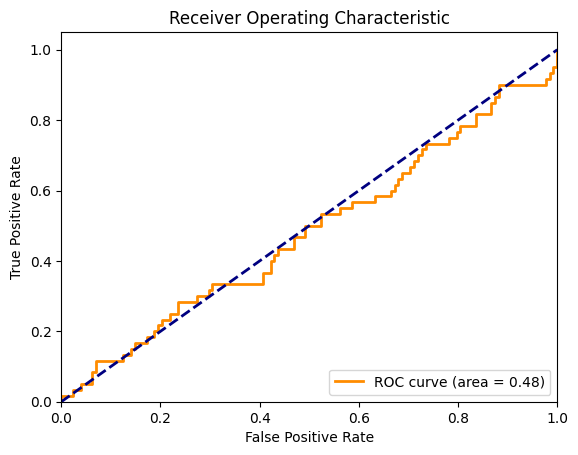

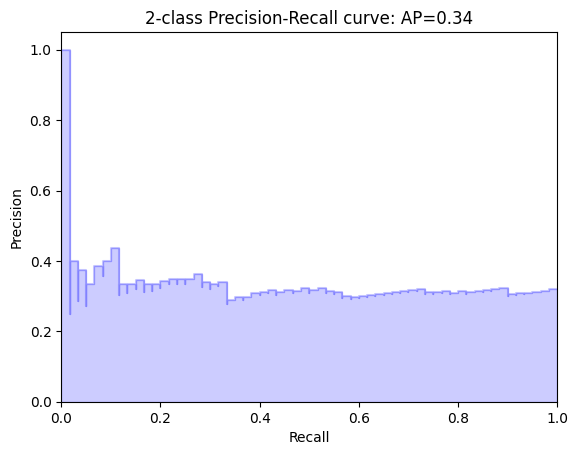

Confusion matrix, without normalization
[[128   0]
 [ 60   0]]


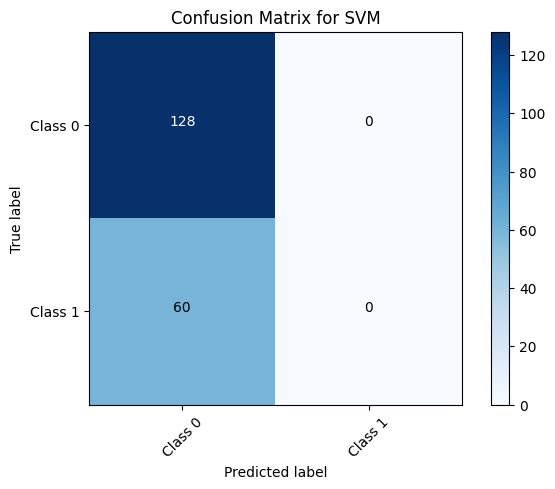

In [ ]:
# SVM Model Evaluation with Cross-Validation
def evaluate_and_plot_svm(feature_subset):
    X_subset = X[feature_subset]
    model = SVC(kernel='linear', probability=True, random_state=42)

    # Cross-validated predictions with probabilities
    y_proba = cross_val_predict(model, X_subset, y, cv=kfold, method="predict_proba")

    # Positive class is the second column
    plot_roc_curve(y, y_proba[:, 1])
    plot_precision_recall_curve(y, y_proba[:, 1])

# audio_features is the feature set
evaluate_and_plot_svm(audio_features)

# CM for SVM
y_pred_svm = cross_val_predict(SVC(kernel='linear', probability=True, random_state=42), X, y, cv=kfold, method="predict")
cm_svm = confusion_matrix(y, y_pred_svm)
plot_confusion_matrix(cm_svm, classes=['Class 0', 'Class 1'], title='Confusion Matrix for SVM')

2. Random Forest

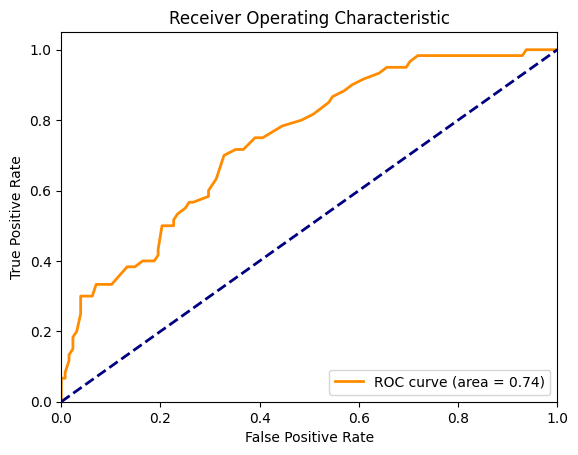

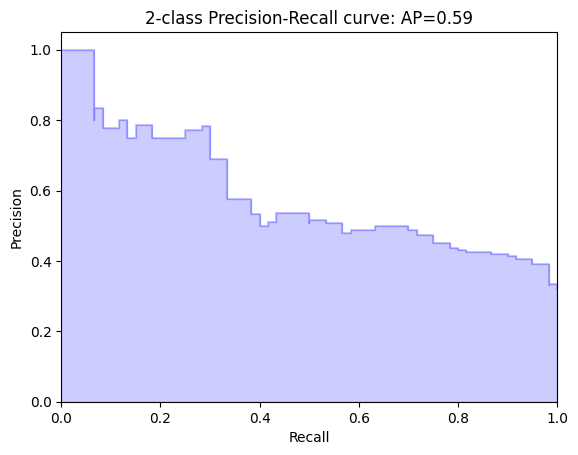

Confusion matrix, without normalization
[[110  18]
 [ 37  23]]


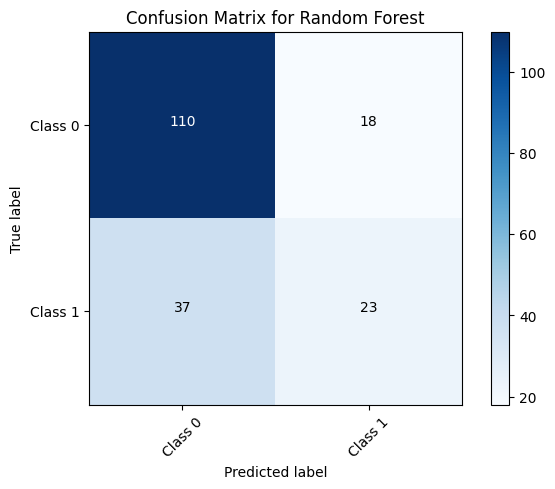

In [ ]:
# Random Forest Model Evaluation with Cross-Validation
def evaluate_and_plot_rf(feature_subset):
    X_subset = X[feature_subset]
    model = RandomForestClassifier(random_state=42)

    # Cross-validated predictions with probabilities
    y_proba = cross_val_predict(model, X_subset, y, cv=kfold, method="predict_proba")

    plot_roc_curve(y, y_proba[:, 1])
    plot_precision_recall_curve(y, y_proba[:, 1])

# same feature set
evaluate_and_plot_rf(audio_features)

# CM for Random Forest
y_pred_rf = cross_val_predict(RandomForestClassifier(random_state=42), X, y, cv=kfold)
cm_rf = confusion_matrix(y, y_pred_rf)
plot_confusion_matrix(cm_rf, classes=['Class 0', 'Class 1'], title='Confusion Matrix for Random Forest')

3. Logistic Regression

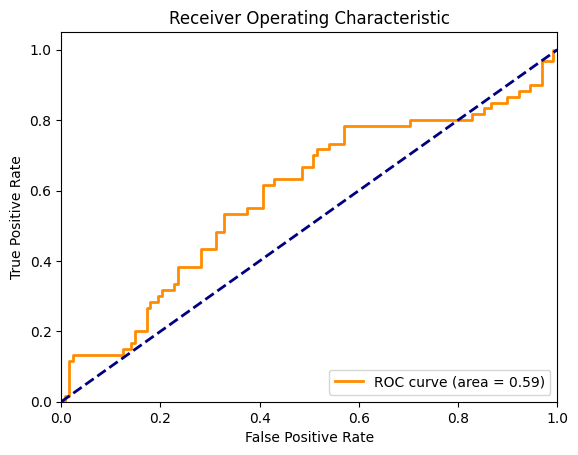

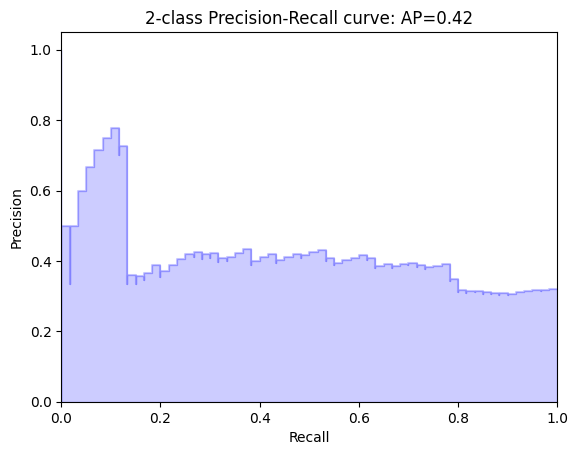

Confusion matrix, without normalization
[[121   7]
 [ 52   8]]


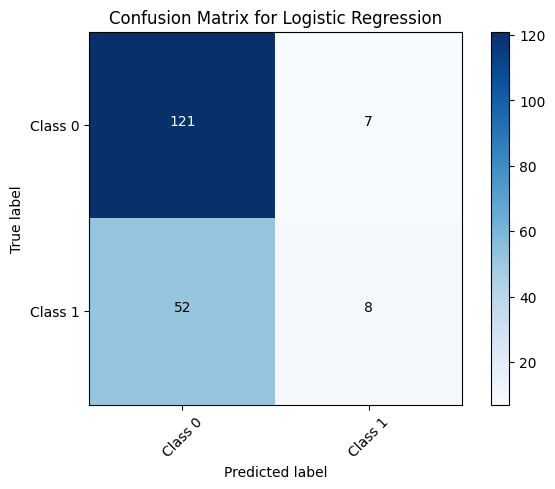

In [ ]:
# Logistic Regression Model Evaluation with Cross-Validation
def evaluate_and_plot_lr(feature_subset):
    X_subset = X[feature_subset]
    model = LogisticRegression(max_iter=1000, random_state=42)

    # Cross-validated predictions with probabilities
    y_proba = cross_val_predict(model, X_subset, y, cv=kfold, method="predict_proba")

    plot_roc_curve(y, y_proba[:, 1])
    plot_precision_recall_curve(y, y_proba[:, 1])

# same feature set
evaluate_and_plot_lr(audio_features)

# CM for Logistic Regression
y_pred_lr = cross_val_predict(LogisticRegression(max_iter=1000), X, y, cv=kfold)
cm_lr = confusion_matrix(y, y_pred_lr)
plot_confusion_matrix(cm_lr, classes=['Class 0', 'Class 1'], title='Confusion Matrix for Logistic Regression')

# Creating 2 dataframes for experimentation (for Mutlimodal approach)

In [ ]:
audio_df = pd.read_csv('/content/drive/My Drive/DAIC-Woz/Audio_full_features_set_final.csv')

# top 15 audio from RFE RF selector:
feat_15 = [
    'MFCC_median_4_mean', 'MFCC_median_4_median', 'MFCC_mean_11_median', 'MFCC_mean_11_std', 'MFCC_std_11_std', 'MFCC_mean_13_mean', 'MFCC_mean_13_median', 'pitch_std_mean',
    'pitch_std_median', 'shimmer_local_std', 'hnr_std', 'median_F1', 'std_F1', 'std_F2', 'std_F5'
]

audio_df_15 = audio_df[['interview_id'] + feat_15]

# Save new dataframe
audio_df_15.to_csv('/content/drive/My Drive/DAIC-Woz/AUDIO-15-for-concat.csv', index=False)



# top 10 audio from RFE RF selector:

feat_10 = [
    'MFCC_median_4_mean', 'MFCC_std_11_std', 'MFCC_mean_13_median', 'pitch_std_mean', 'pitch_std_median', 'shimmer_local_std', 'hnr_std', 'median_F1', 'std_F1', 'std_F5'
]

audio_df_10 = audio_df[['interview_id'] + feat_10]

# Save new dataframe
audio_df_10.to_csv('/content/drive/My Drive/DAIC-Woz/AUDIO-10-for-concat.csv', index=False)
